In [67]:
import datetime
import socket

# Get local time
local_time = datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S")

# Get computer ID or hostname
computer_id = socket.gethostname()

# Print output with local time and computer ID
print('Final Project: by Mustapha Oyegunle') 
print('Local Time:', local_time)
print('Computer ID:', computer_id)

Final Project: by Mustapha Oyegunle
Local Time: 2024-03-10 19:09:25
Computer ID: DESKTOP-U88C9OD


# Project Definition

This project aims to generate predictive functions to accurately predict average crop yields and deviations (Std Devs) when the crop type and future year are supplied. 

These predictions use the linear regression method, which in turn is assumed to average out the effect of soil quality (type), climate, and improving  Ag technologies. 

The follow-up project is planned to incorporate the Manitoba GIS map and predict within each Rural Municipality and soil types using trained models in machine learning.


# Problem Statement

It is common for existing farmers to rotate to new crops and new farmers not to leverage the existing historical data to estimate the expected yields of the new crop in the province. This has been part of the causes of the great losses incurred by some farmers, especially the small and medium-scale ones. 
Resolving the challenges to predict crop yields will help to greatly reduce unforeseen losses and help Ag insurance companies to accurately set insurance costs (premiums) tailored to each crop.


In [5]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sb

# ETL

In [6]:
# Reading yield data from local file
df=pd.read_excel('/PS/Palette Skill/Class Videos and Resources/Stream-3/Manitoba Crop Yield Data and Map/Manitoba_yield_Yr2000_2022_for_11_Selected_Crops.xlsx')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61044 entries, 0 to 61043
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Year                  61044 non-null  int64 
 1   Risk Area / R.M.      61044 non-null  object
 2   Crop                  61044 non-null  object
 3   Soil                  61044 non-null  object
 4   Farms                 61044 non-null  object
 5   Acres                 61044 non-null  object
 6   Yield/acre(Metric)    61044 non-null  object
 7   Yield/acre(Metric).1  24887 non-null  object
 8   Yield/acre(Imperial)  24887 non-null  object
dtypes: int64(1), object(8)
memory usage: 4.2+ MB


In [8]:
# Reading shapefile from local file
gdf=gpd.read_file('/PS/Palette Skill/Class Videos and Resources/Stream-3/Manitoba Crop Yield Data and Map/MG_MUNICIPALITY_POLY.shp')

In [9]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 183 entries, 0 to 182
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   OBJECTID    183 non-null    int64   
 1   MUNI_NO     183 non-null    int64   
 2   MUNI_NAME   183 non-null    object  
 3   MUNI_TYPE   183 non-null    object  
 4   MUNI_LIST_  183 non-null    object  
 5   MUNI_LIS_1  183 non-null    object  
 6   SHAPE_Leng  183 non-null    float64 
 7   SHAPE_Area  183 non-null    float64 
 8   geometry    183 non-null    geometry
dtypes: float64(2), geometry(1), int64(2), object(4)
memory usage: 13.0+ KB


## Data Standardizing

In [10]:
# Changing columns names
df_clean_1=df.rename(columns={'Risk Area / R.M.': 'RM', 'Yield/acre(Imperial)': 'Yield'})\
    .drop(columns=['Yield/acre(Metric)', 'Yield/acre(Metric).1'])

In [11]:
# Sorting Values
df_clean_2=df_clean_1.sort_values(['RM', 'Year', 'Crop'])

In [12]:
# Splitting Yield column to two - numeric and unit columns and 
df_clean_3=pd.concat([
    df_clean_2,
    df_clean_2['Yield'].str.split(' ', expand=True).rename(columns={0:'Yield_Float', 1:'Unit'})], axis=1)

In [13]:
df_clean_3

,Year,RM,Crop,Soil,Farms,Acres,Yield,Yield_Float,Unit
21394,2000,ALEXANDER,ARGENTINE CANOLA,F,12,"2,401.0",24.1 Bushels,24.1,Bushels
21661,2000,ALEXANDER,ARGENTINE CANOLA,E,10,"1,509.0",23.3 Bushels,23.3,Bushels
22851,2000,ALEXANDER,ARGENTINE CANOLA,G,10,930,19.0 Bushels,19.0,Bushels
23794,2000,ALEXANDER,ARGENTINE CANOLA,H,5,"1,464.0",13.5 Bushels,13.5,Bushels
24887,2000,ALEXANDER,ARGENTINE CANOLA,D,Below,Minimum,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
61041,2022,YELLOWHEAD,FLAX,B,Below,Minimum,NaN,NaN,NaN
61042,2022,YELLOWHEAD,FLAX,C,Below,Minimum,NaN,NaN,NaN
587,2022,YELLOWHEAD,OATS,C,10,"2,976.0",130.0 Bushels,130.0,Bushels
629,2022,YELLOWHEAD,OATS,B,10,"1,889.0",128.3 Bushels,128.3,Bushels


In [14]:
# Removing commas
df_clean_3['Yield_Float'].replace(to_replace={',': ''}, inplace=True)

In [15]:
df_clean_3['Unit'].unique()

array(['Bushels', nan, 'Pounds', 'Tons'], dtype=object)

In [16]:
df_clean_3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 61044 entries, 21394 to 61043
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Year         61044 non-null  int64 
 1   RM           61044 non-null  object
 2   Crop         61044 non-null  object
 3   Soil         61044 non-null  object
 4   Farms        61044 non-null  object
 5   Acres        61044 non-null  object
 6   Yield        24887 non-null  object
 7   Yield_Float  24887 non-null  object
 8   Unit         24887 non-null  object
dtypes: int64(1), object(8)
memory usage: 4.7+ MB


In [17]:
# Replace commas and convert to float
df_clean_3['Yield_Float'] = df_clean_3['Yield_Float'].str.replace(',', '').astype(float)

In [18]:
#Pivoting the table, make sure you check the ag function. 
df_clean_4=df_clean_3.pivot_table(index=['Year', 'RM', 'Soil', 'Farms','Acres', 'Unit'], columns='Crop',values='Yield_Float' )\
                .reset_index()

In [19]:
# Standardizing column names 

df_clean_4.columns=df_clean_4.columns.str.capitalize()

In [20]:
# Fababeans / 60, Lentils/60), Canaryseed /50 - Pounds to Bushels, Alfalfa * 45 - Tons to Bushels of Hays

In [21]:
# Convertng pounds to bushels
# Fababeans / 60, Lentils/60), Canaryseed /50 - Pounds to Bushels
df_clean_4['Fababeans']= df_clean_4['Fababeans'] / 60
df_clean_4['Lentils'] = df_clean_4['Lentils'] / 60
df_clean_4['Canaryseed']=df_clean_4['Canaryseed'] / 50
df_clean_4['Alfalfa']=df_clean_4['Alfalfa'] * 45

In [22]:
df_clean_4.describe().T

,count,mean,std,min,25%,50%,75%,max
Crop,,,,,,,,
Year,24887.0,2010.183710,6.734999,2000.000000,2004.000000,2009.000000,2016.000000,2022.000000
Farms,24887.0,17.013059,17.214860,3.000000,6.000000,11.000000,21.000000,154.000000
Alfalfa,415.0,95.004108,41.201153,11.565000,64.642500,92.385000,124.515000,292.725000
Argentine canola,9543.0,34.530714,9.994812,0.300000,28.000000,35.100000,42.000000,85.100000
Barley,4891.0,64.857677,19.214300,3.900000,52.800000,65.800000,78.500000,116.900000
Canaryseed,182.0,19.316703,10.458551,0.880000,10.770000,18.960000,26.780000,51.340000
Durum wheat,70.0,36.648571,7.872181,18.000000,31.700000,37.450000,40.875000,54.100000
Fababeans,25.0,37.903333,11.470229,11.766667,32.083333,37.716667,44.466667,61.033333
Field peas,916.0,43.427948,13.885639,3.000000,35.075000,42.850000,52.600000,80.000000


In [23]:
df_clean_4

Crop,Year,Rm,Soil,Farms,Acres,Unit,Alfalfa,Argentine canola,Barley,Canaryseed,Durum wheat,Fababeans,Field peas,Flax,Lentils,Oats,Winter wheat
0,2000,ALEXANDER,E,6,843,Bushels,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,83.6,NaN
1,2000,ALEXANDER,E,10,"1,509.0",Bushels,NaN,23.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2000,ALEXANDER,F,8,833,Bushels,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,82.2,NaN
3,2000,ALEXANDER,F,12,"2,401.0",Bushels,NaN,24.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2000,ALEXANDER,G,10,930,Bushels,NaN,19.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24882,2022,YELLOWHEAD,B,7,"2,336.0",Bushels,NaN,NaN,NaN,NaN,NaN,NaN,64.3,NaN,NaN,NaN,NaN
24883,2022,YELLOWHEAD,B,17,"4,910.0",Bushels,NaN,NaN,81.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24884,2022,YELLOWHEAD,B,49,"28,214.0",Bushels,NaN,44.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24885,2022,REYNOLDS,F,5,629,Bushels,NaN,44.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
ds=df_clean_4.copy()

In [25]:
ds['Rm'].nunique() * ds['Year'].nunique()

2231

# EDA ( Exploratory Data Analysis)

## Missing Values

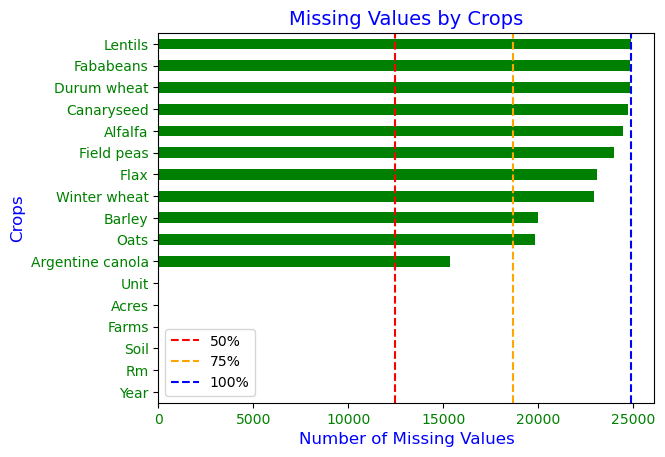

In [26]:
# Checking for missing values

ds.isna().sum()\
    .sort_values()\
    .plot(kind='barh', color='green')
plt.title('Missing Values by Crops', color= 'blue', size = 14)
plt.xlabel('Number of Missing Values', color= 'blue', size = 12)
plt.ylabel ('Crops', color= 'blue', size = 12)
plt.xticks(color='green')
plt.yticks(color='green')
plt.axvline(len(ds)/2, color='red', linestyle='--', label='50%') # half of dataset
plt.axvline(len(ds) * 0.75 , color='orange', linestyle='--', label='75%') # 75% of dataset
plt.axvline(len(ds) , color='blue', linestyle='--', label='100%') # 100% of dataset
plt.legend()
plt.show()

**Missing Values Handling**

- Fill with 0, mean or median - Lazy data scientist
- Drop them - Super Lazy
- Use ML to fill them - Smart
- Use groupby and fill averges - Bit smarter
- Geographic Locations - Neighboring Farms and Rural Municipalities

## Basic descriptive statistics

In [27]:
ds.describe().drop(columns=['Year', 'Farms'])

Crop,Alfalfa,Argentine canola,Barley,Canaryseed,Durum wheat,Fababeans,Field peas,Flax,Lentils,Oats,Winter wheat
count,415.000000,9543.000000,4891.000000,182.000000,70.000000,25.000000,916.000000,1813.000000,10.000000,5059.000000,1963.000000
mean,95.004108,34.530714,64.857677,19.316703,36.648571,37.903333,43.427948,20.966078,19.933333,91.691817,63.232145
std,41.201153,9.994812,19.214300,10.458551,7.872181,11.470229,13.885639,6.812380,9.735686,28.909526,13.624436
min,11.565000,0.300000,3.900000,0.880000,18.000000,11.766667,3.000000,0.000000,5.450000,6.900000,6.500000
25%,64.642500,28.000000,52.800000,10.770000,31.700000,32.083333,35.075000,16.800000,14.175000,71.100000,54.700000
50%,92.385000,35.100000,65.800000,18.960000,37.450000,37.716667,42.850000,21.000000,16.625000,91.700000,64.300000
75%,124.515000,42.000000,78.500000,26.780000,40.875000,44.466667,52.600000,25.200000,23.904167,112.000000,73.000000
max,292.725000,85.100000,116.900000,51.340000,54.100000,61.033333,80.000000,46.400000,36.850000,185.900000,96.000000


<Axes: xlabel='Crop'>

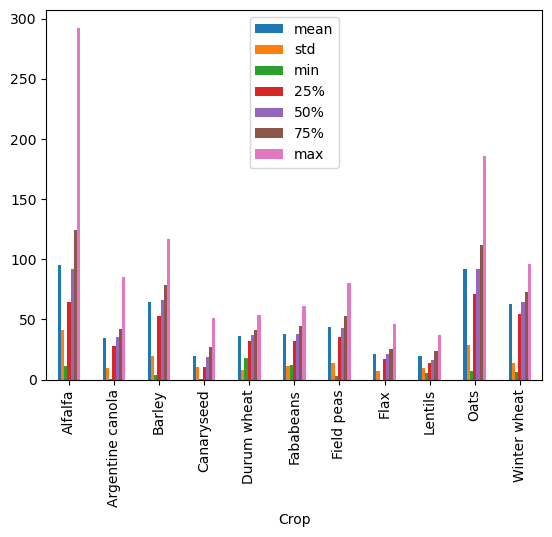

In [28]:
ds.describe().drop(columns=['Year', 'Farms']).drop('count', axis=0).T\
    .plot(kind='bar')

In [29]:
ds_des=ds.describe().drop(columns=['Year', 'Farms']).drop('count', axis=0).T

<Axes: xlabel='Crop'>

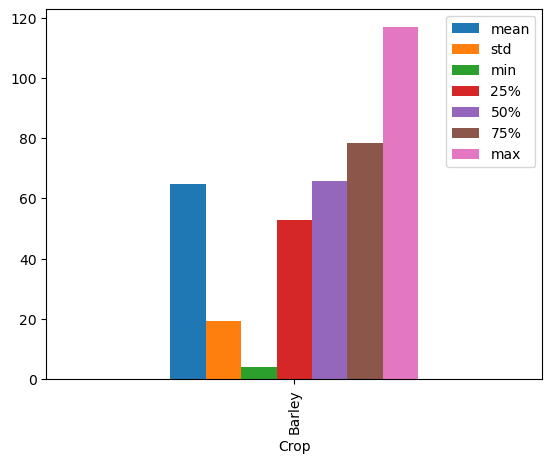

In [30]:
# Not the best way to go as we have histograms or boxplots
ds_des.loc[ds_des.index=='Barley']\
    .plot(kind='bar')

## Histograms

In [31]:
# Creating list of columns
columns_yield = ['Alfalfa',
       'Argentine canola', 'Barley', 'Canaryseed', 'Durum wheat', 'Fababeans',
       'Field peas', 'Flax', 'Lentils', 'Oats', 'Winter wheat']

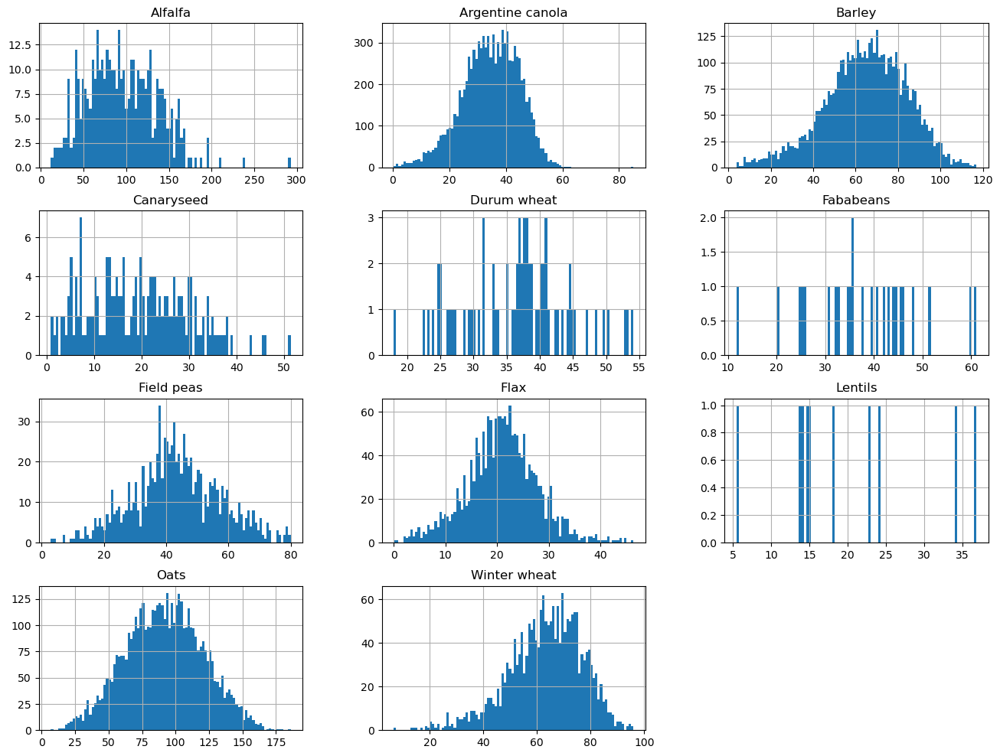

In [32]:
# When training models we want normal dist with zero mean and std of 1
# Data standarization  - zscore, min-max scler 

ds[columns_yield].hist(figsize=(16,12),
                       bins=100)
plt.show()

In [34]:
ds_y = ds.set_index('Year')[columns_yield].reset_index()

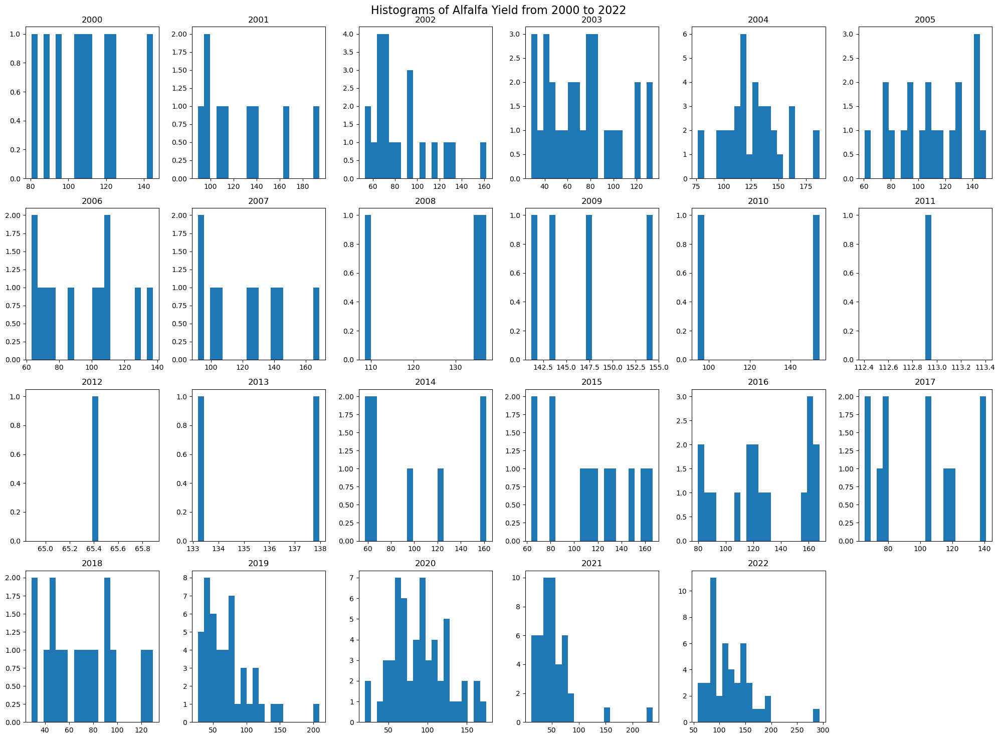

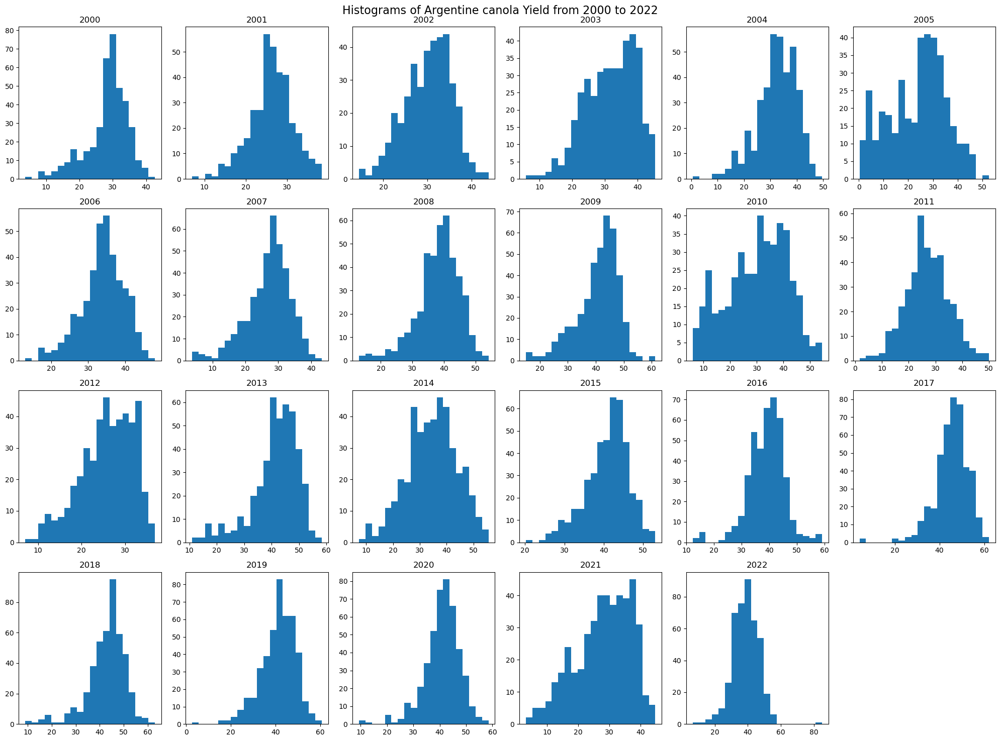

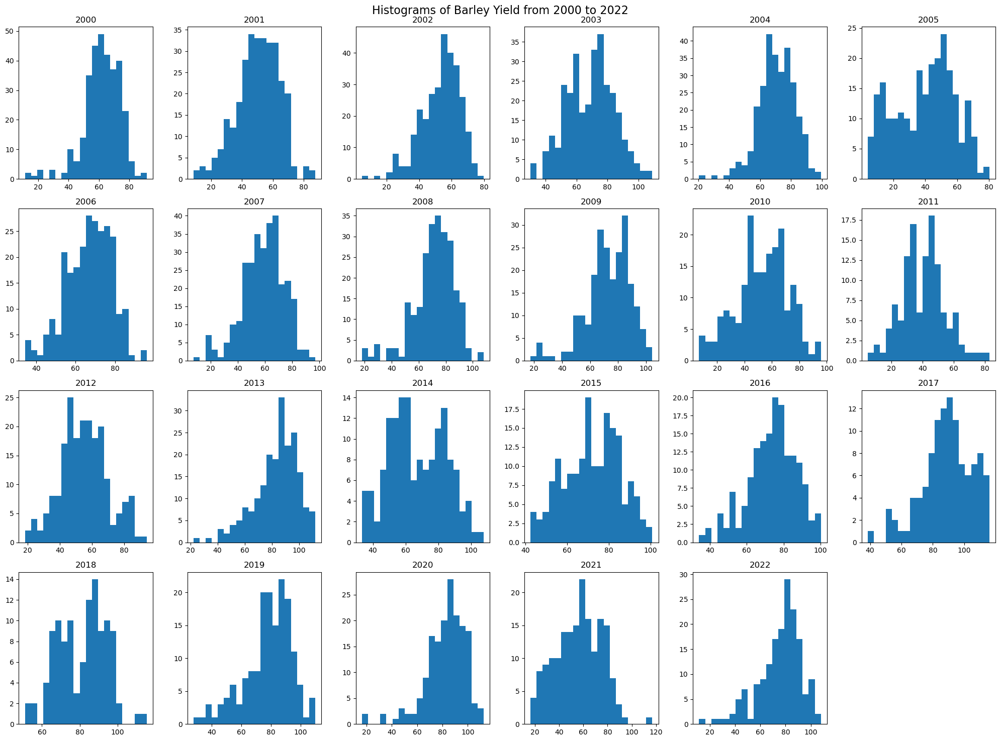

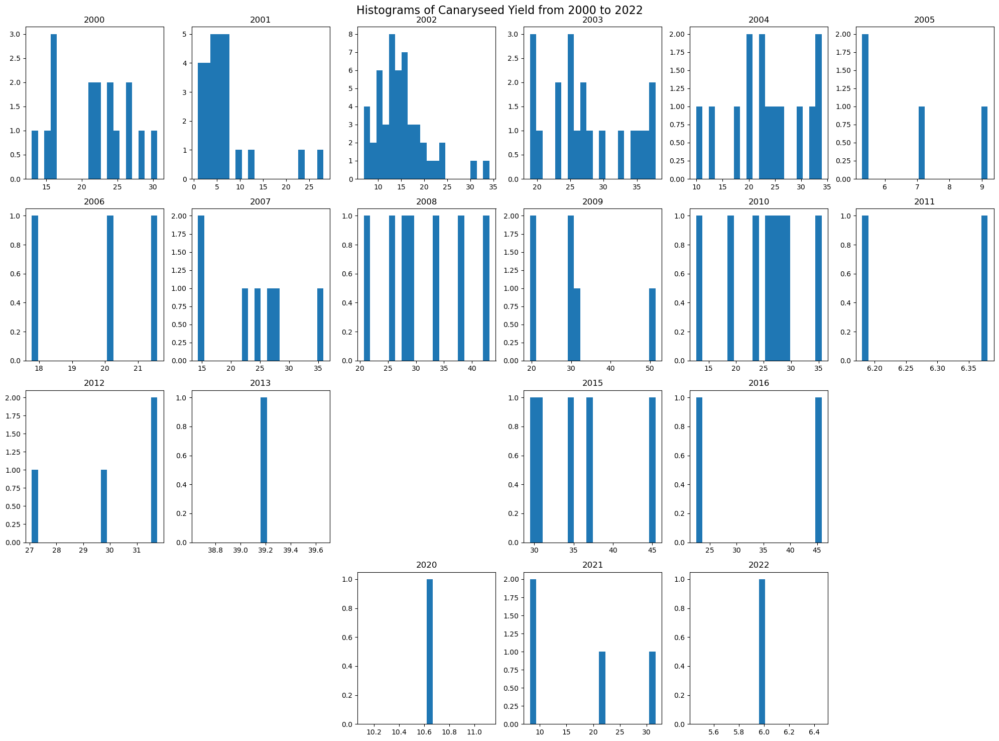

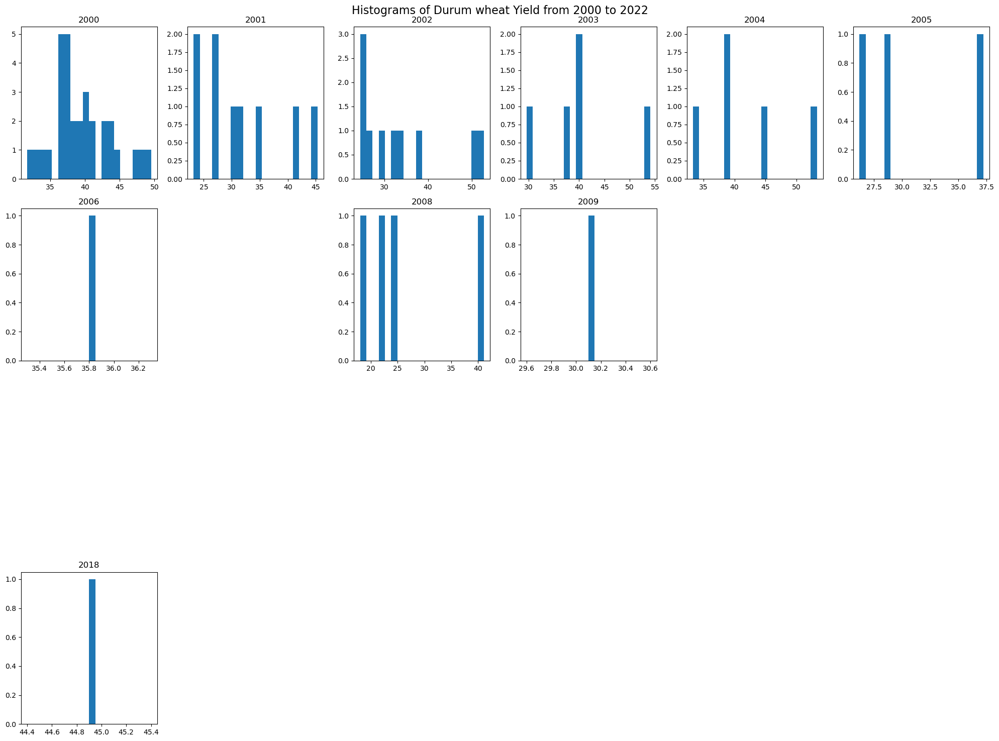

...

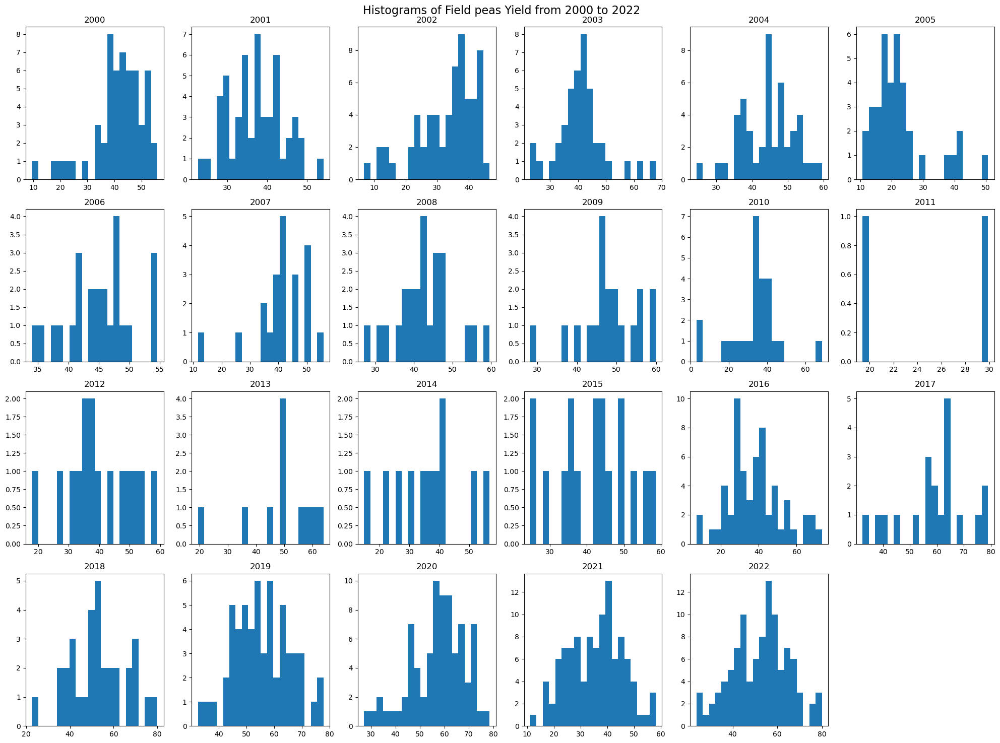

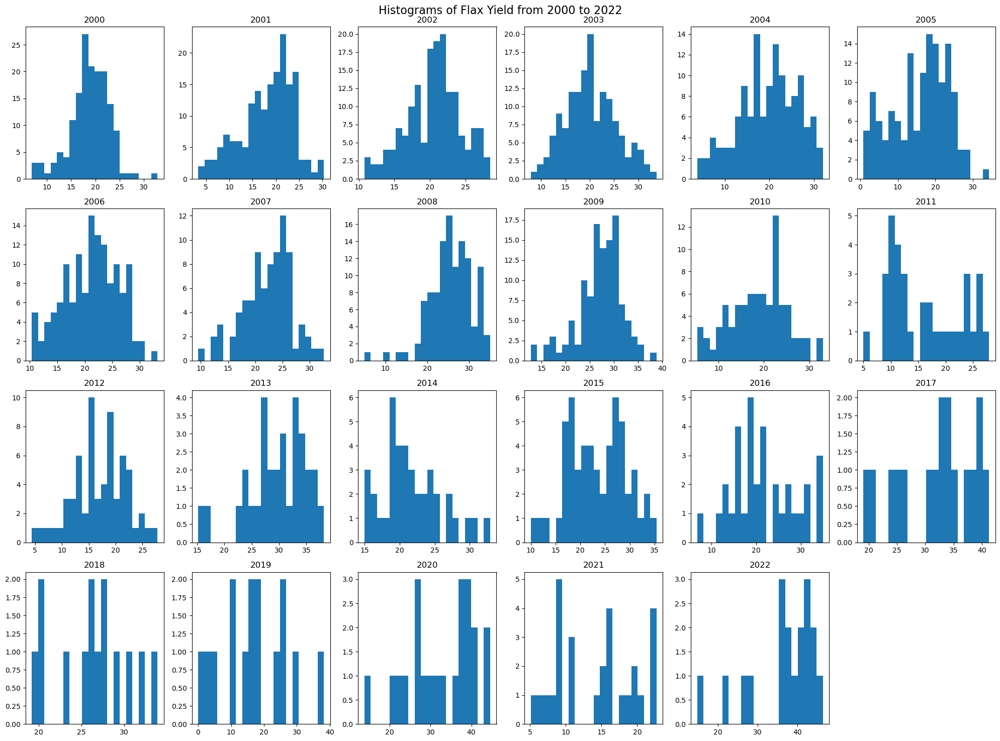

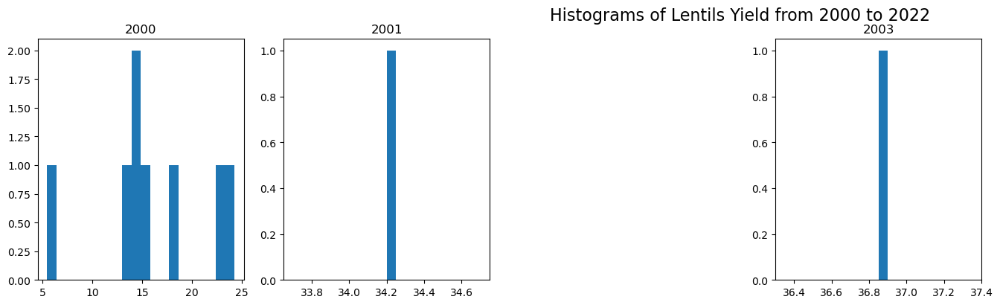

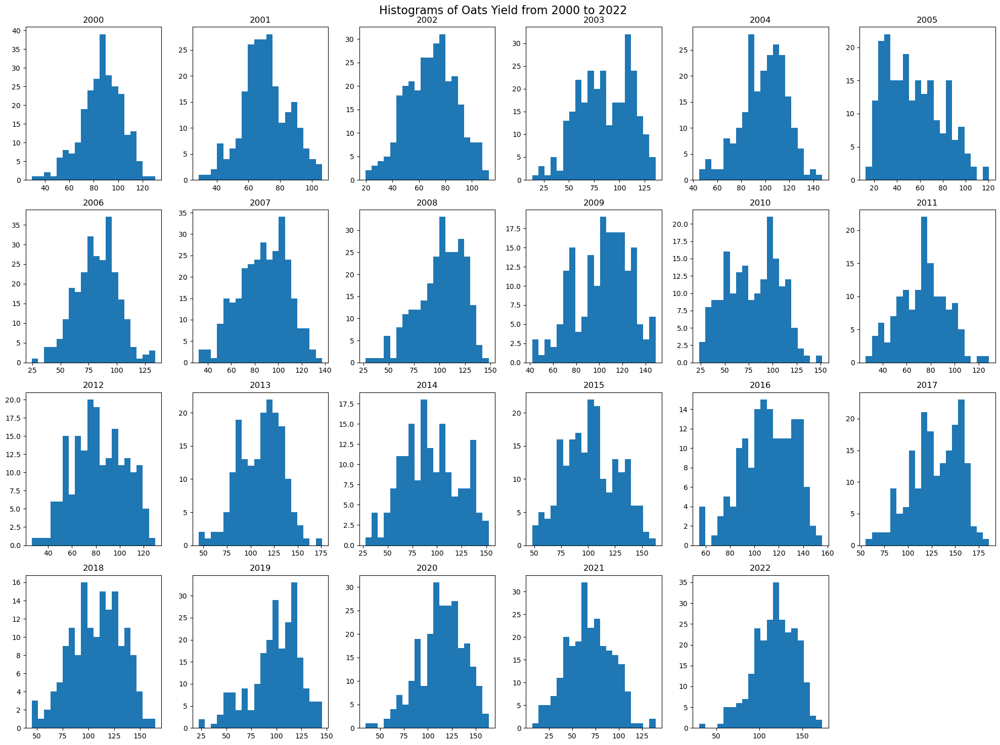

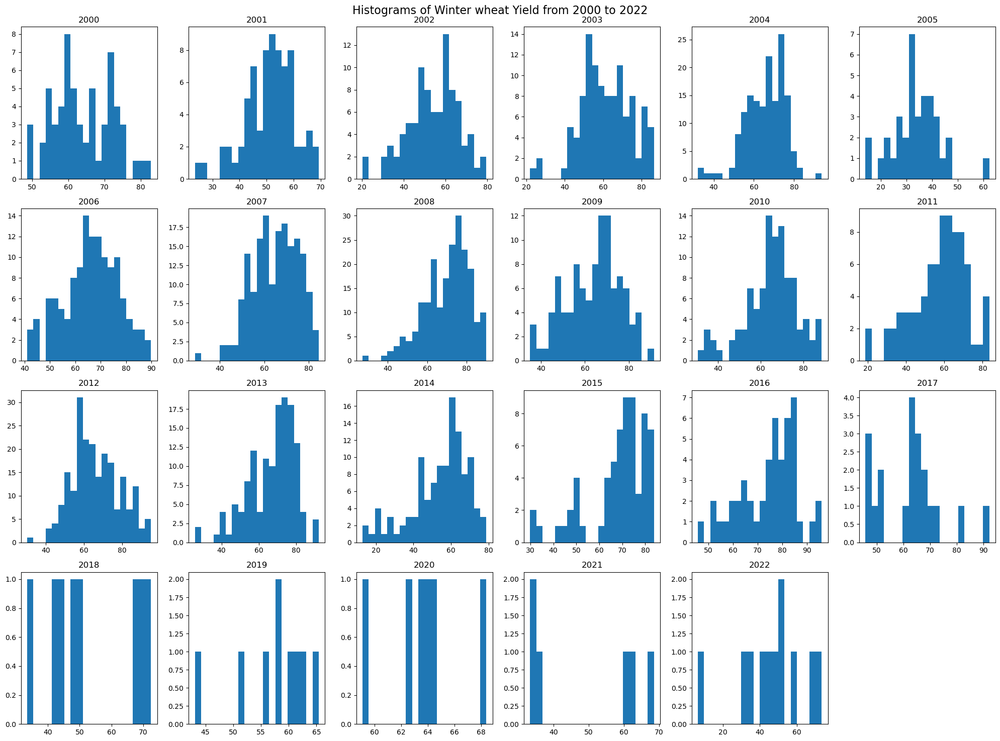

In [35]:
import matplotlib.pyplot as plt
import numpy as np  # Ensure numpy is imported

# Assuming 'ds_y' has a 'Year' column and multiple columns for different crops
# And you want to plot histograms for years 2000 to 2022

# Define the range of years you're interested in
start_year = 2000
end_year = 2022
years = range(start_year, end_year + 1)

# Define the layout for subplots
rows = 4
cols = 6
total_plots = rows * cols

# Iterate over each crop in the DataFrame
for crop in ds_y.columns.drop('Year'):
    # Create a new figure for each crop
    fig, axs = plt.subplots(rows, cols, figsize=(20, 15), tight_layout=True)
    fig.suptitle(f'Histograms of {crop} Yield from {start_year} to {end_year}', fontsize=16)
    
    # Counter for the subplot index
    plot_index = 0
    
    for year in years:
        # Select the row where 'Year' equals the current year and the column for the current crop
        data_for_year = ds_y[ds_y['Year'] == year][crop]
        
        # Check if the data for the year is not all NaN
        if not data_for_year.isna().all():
            # Plot in the subplot
            ax = axs[plot_index // cols, plot_index % cols]
            ax.hist(data_for_year.dropna(), bins=20)  # Drop NaN values and plot
            ax.set_title(f'{year}')
        else:
            # Handle the case with all NaN values (e.g., by setting the title to indicate no data)
            ax = axs[plot_index // cols, plot_index % cols]
            ax.set_title(f'{year} (No data)')
            ax.set_visible(False)  # Optionally hide the axis for years with no data
        
        # Increment the plot_index
        plot_index += 1
        
        # Break the loop if we have filled all subplots
        if plot_index >= total_plots:
            break
    
    # Hide any unused subplots
    for i in range(plot_index, total_plots):
        fig.delaxes(axs.flatten()[i])
    
    plt.show()

## Boxplots

<Axes: >

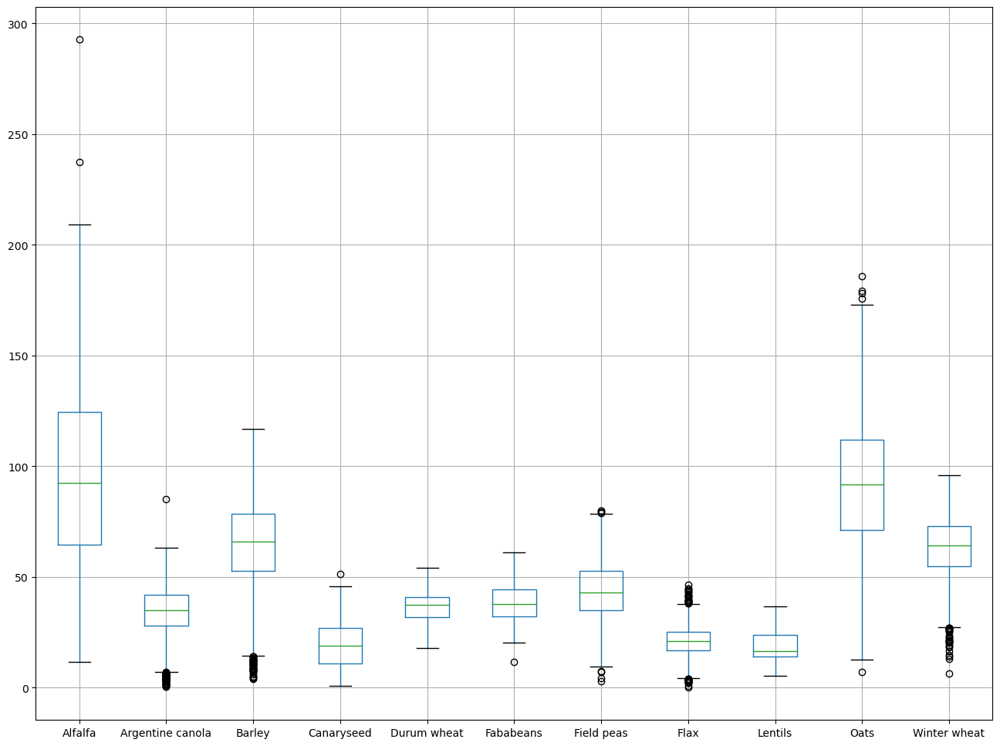

In [44]:
ds_y.set_index('Year').boxplot(figsize=(16,12))

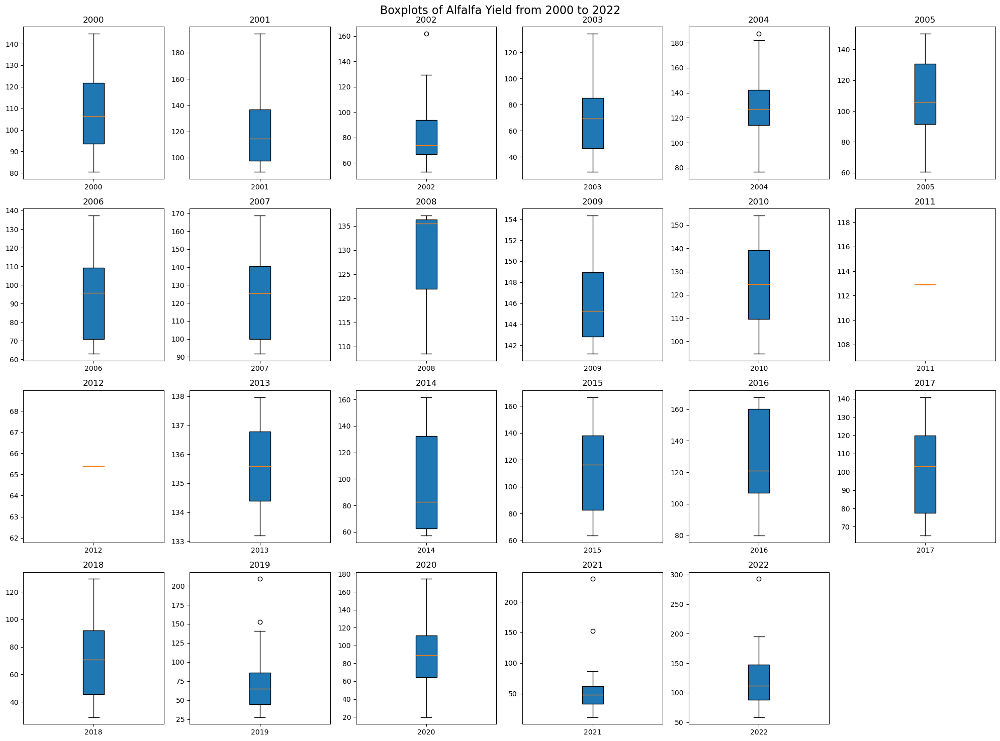

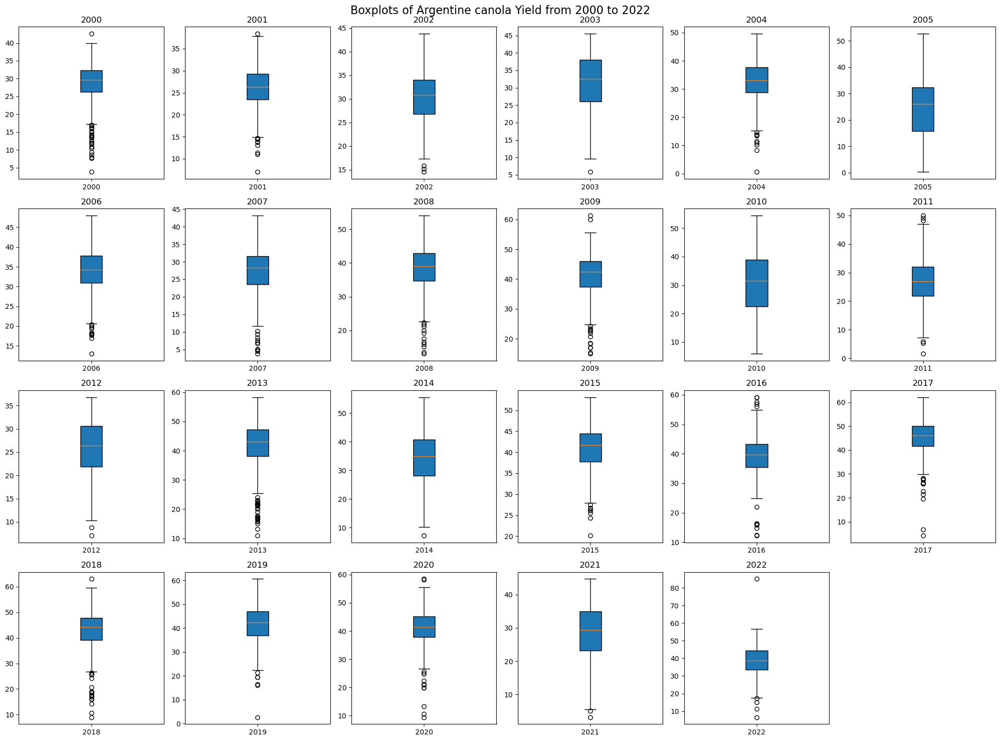

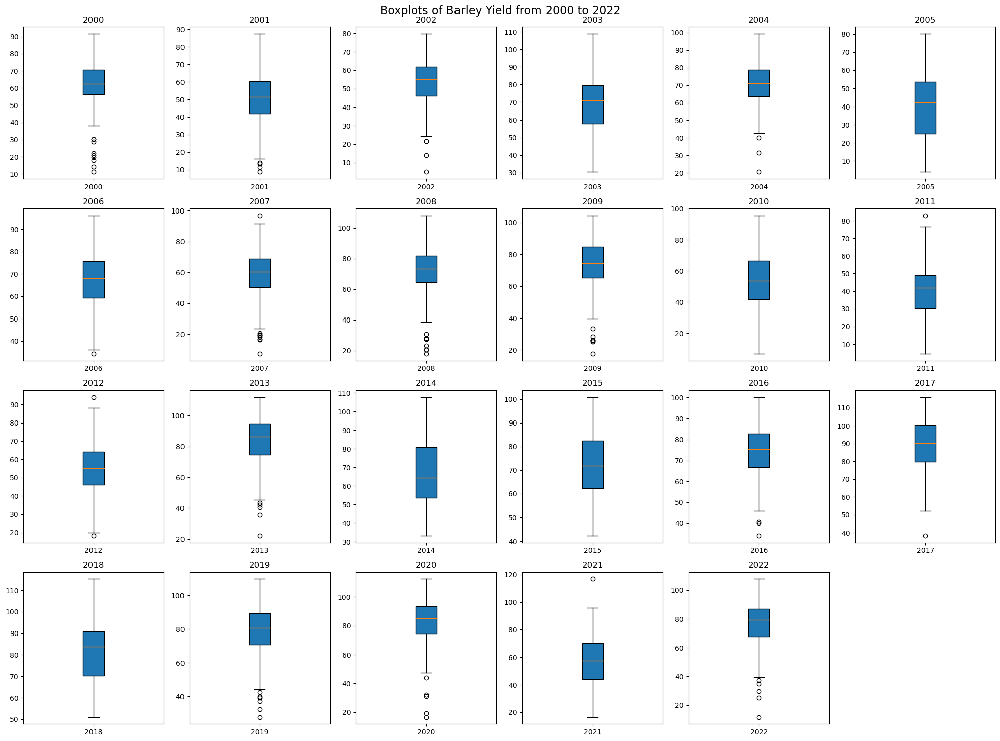

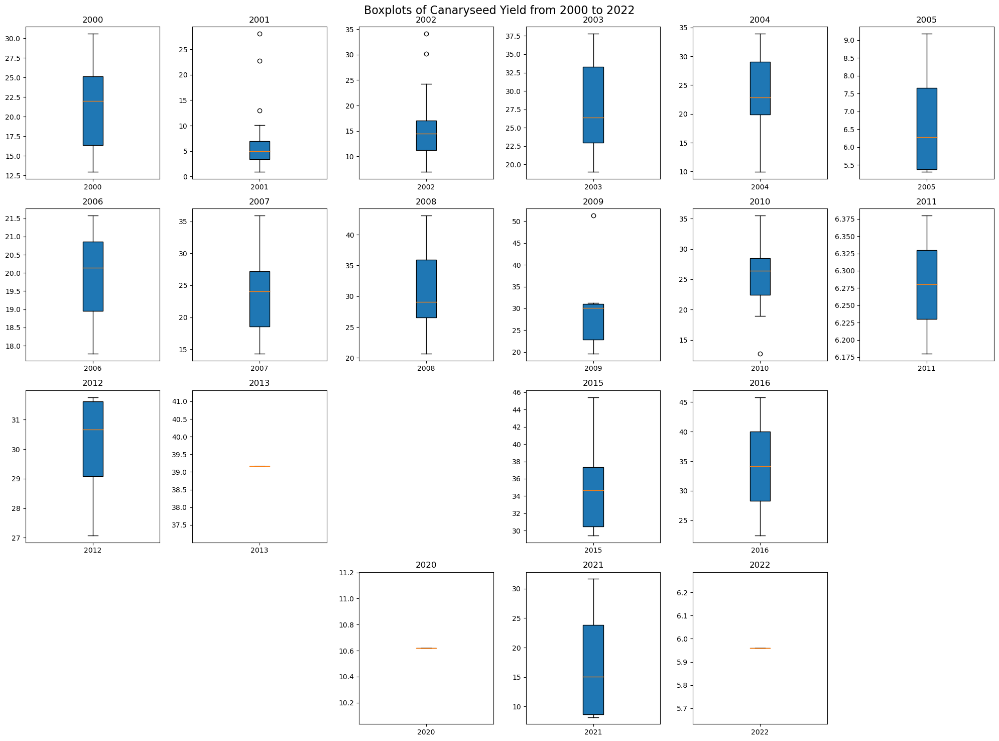

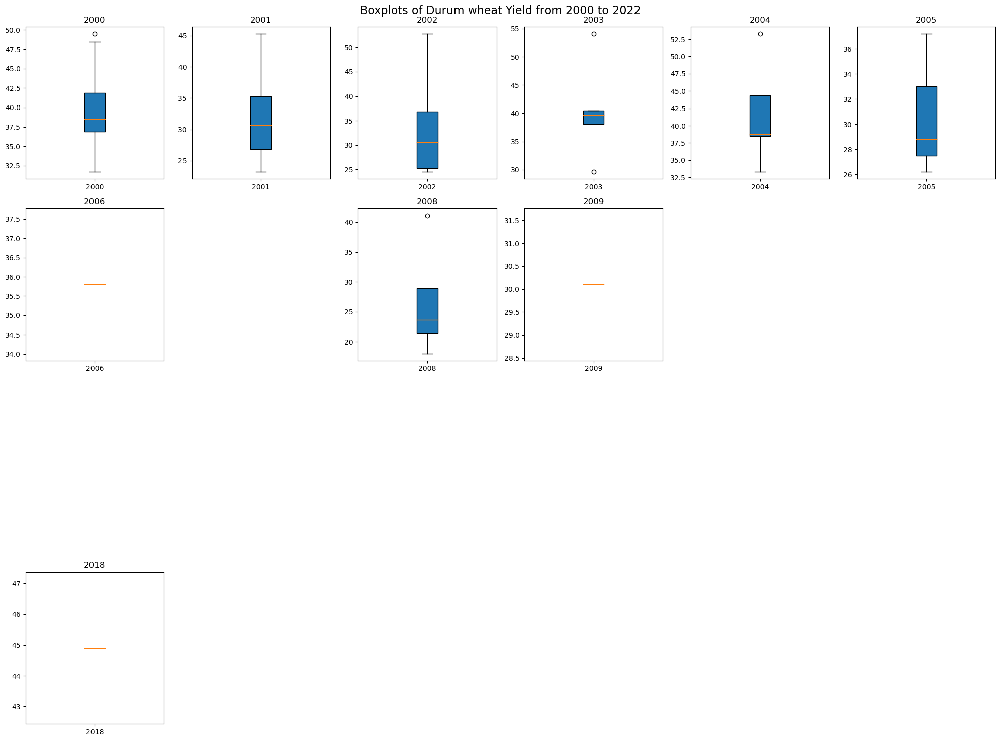

...

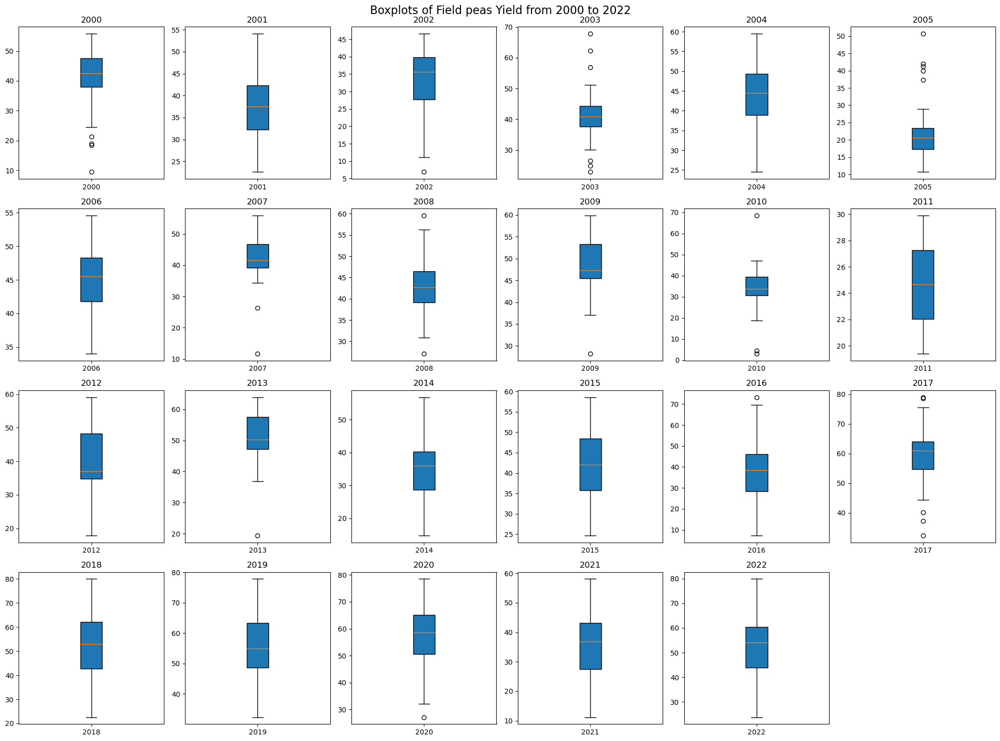

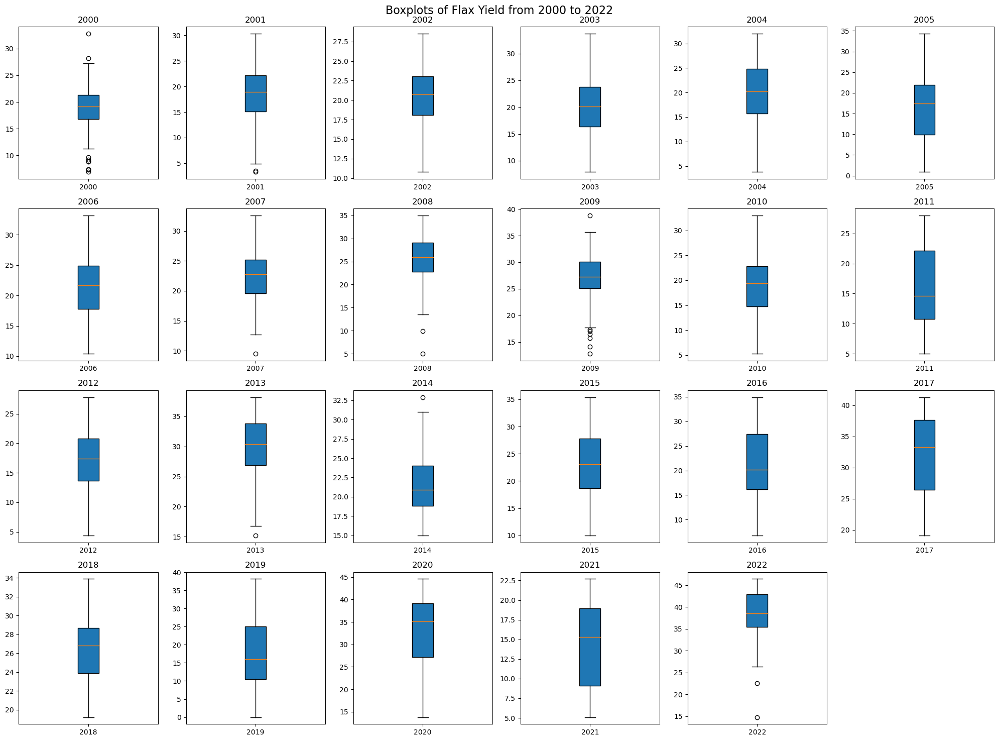

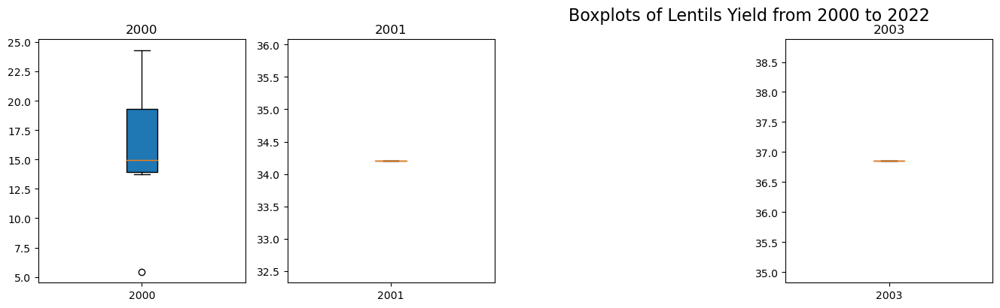

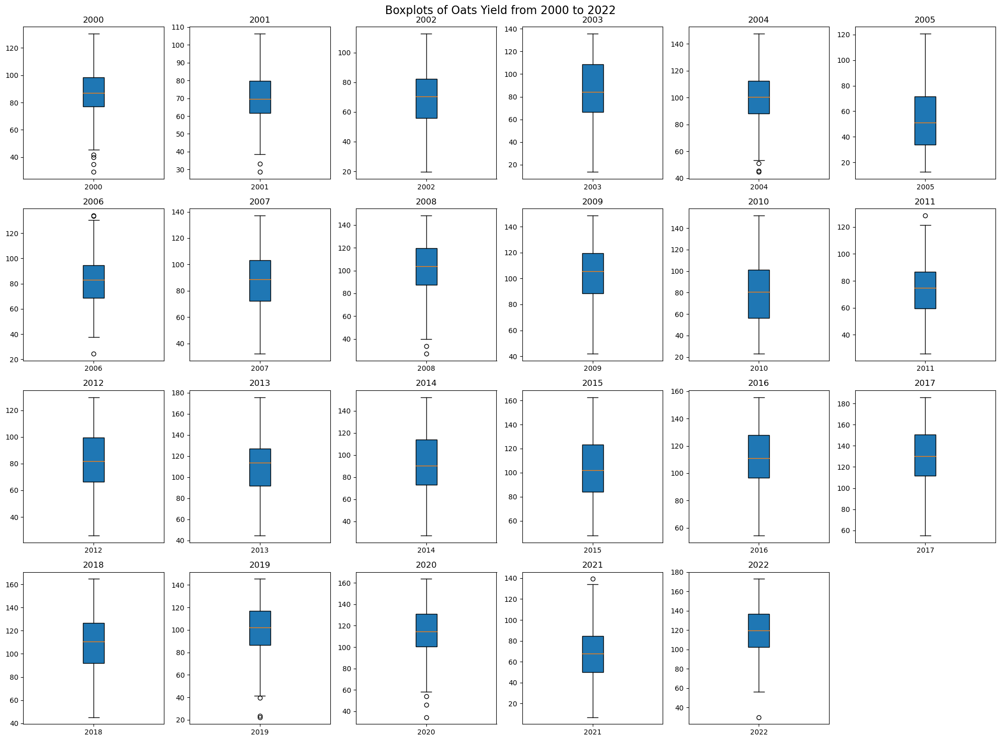

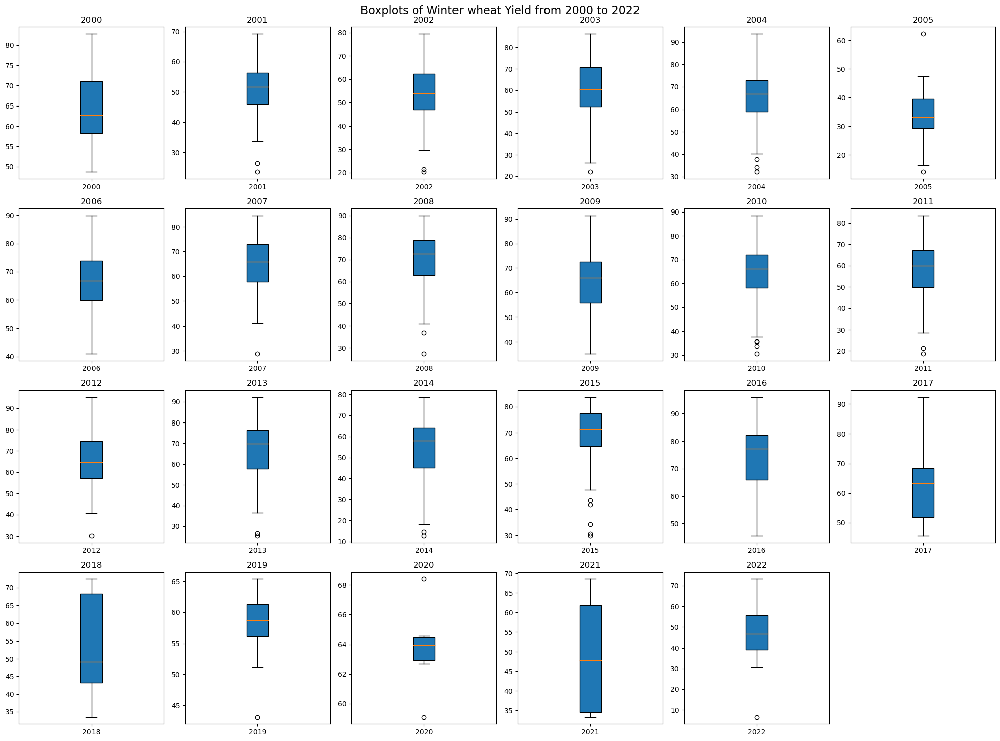

In [45]:
import matplotlib.pyplot as plt
import numpy as np  # Ensure numpy is imported

# Assuming 'ds_y' has a 'Year' column and multiple columns for different crops
# And you want to plot boxplots for years 2000 to 2022

# Define the range of years you're interested in
start_year = 2000
end_year = 2022
years = range(start_year, end_year + 1)

# Define the layout for subplots
rows = 4
cols = 6
total_plots = rows * cols

# Iterate over each crop in the DataFrame
for crop in ds_y.columns.drop('Year'):
    # Create a new figure for each crop
    fig, axs = plt.subplots(rows, cols, figsize=(20, 15), tight_layout=True)
    fig.suptitle(f'Boxplots of {crop} Yield from {start_year} to {end_year}', fontsize=16)
    
    # Counter for the subplot index
    plot_index = 0
    
    for year in years:
        # Select the row where 'Year' equals the current year and the column for the current crop
        data_for_year = ds_y[ds_y['Year'] == year][crop]
        
        # Check if the data for the year is not all NaN
        if not data_for_year.isna().all():
            # Plot in the subplot
            ax = axs[plot_index // cols, plot_index % cols]
            # For boxplot, we need to remove NaN and use data as a list
            ax.boxplot(data_for_year.dropna(), patch_artist=True)  # Use patch_artist for filled box
            ax.set_title(f'{year}')
            ax.set_xticklabels([f'{year}'])  # Set x-axis to show the year
        else:
            # Handle the case with all NaN values (e.g., by setting the title to indicate no data)
            ax = axs[plot_index // cols, plot_index % cols]
            ax.set_title(f'{year} (No data)')
            ax.set_visible(False)  # Optionally hide the axis for years with no data
        
        # Increment the plot_index
        plot_index += 1
        
        # Break the loop if we have filled all subplots
        if plot_index >= total_plots:
            break
    
    # Hide any unused subplots
    for i in range(plot_index, total_plots):
        fig.delaxes(axs.flatten()[i])
    
    plt.show()

## Corelation Analysis

In [46]:
# Not enough observations for given year and RM
ds_y.drop('Year', axis=1).corr()

Crop,Alfalfa,Argentine canola,Barley,Canaryseed,Durum wheat,Fababeans,Field peas,Flax,Lentils,Oats,Winter wheat
Crop,,,,,,,,,,,
Alfalfa,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Argentine canola,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Barley,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Canaryseed,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Durum wheat,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
Fababeans,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
Field peas,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
Flax,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
Lentils,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN


## Scatter Plots

<Axes: xlabel='Argentine canola', ylabel='Year'>

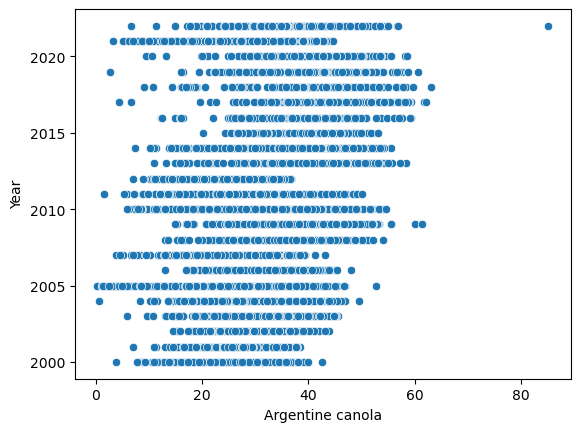

In [47]:
# Not enough data for scatter plot
sb.scatterplot(data = ds, x='Argentine canola', y='Year')

<Axes: xlabel='Year', ylabel='Argentine canola'>

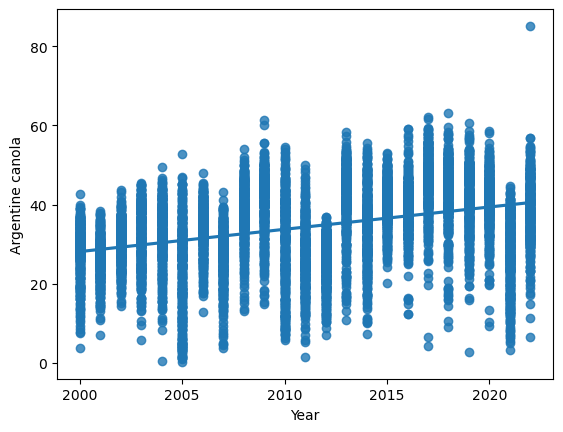

In [48]:
# Not enough data for scatter plot
sb.regplot(data = ds, y='Argentine canola', x='Year')

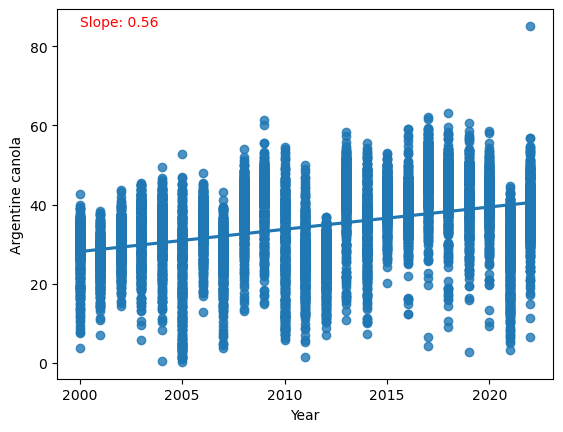

In [49]:
import seaborn as sb
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress

# Assuming 'ds' is your DataFrame, and it contains 'Year' and 'Argentine canola' columns

# First, we'll remove any rows where 'Argentine canola' or 'Year' might be NaN
cleaned_ds = ds.dropna(subset=['Argentine canola', 'Year'])

# Calculate the slope and intercept of the regression line
slope, intercept, r_value, p_value, std_err = linregress(cleaned_ds['Year'], cleaned_ds['Argentine canola'])

# Now, plot the regression line with seaborn's regplot
sb.regplot(data=cleaned_ds, x='Year', y='Argentine canola')

# Annotate the plot with the slope
# Adjust the position of the annotation based on your plot's axes limits
plt.text(x=min(cleaned_ds['Year']), y=max(cleaned_ds['Argentine canola']), 
         s=f'Slope: {slope:.2f}', 
         color='red')

plt.show()


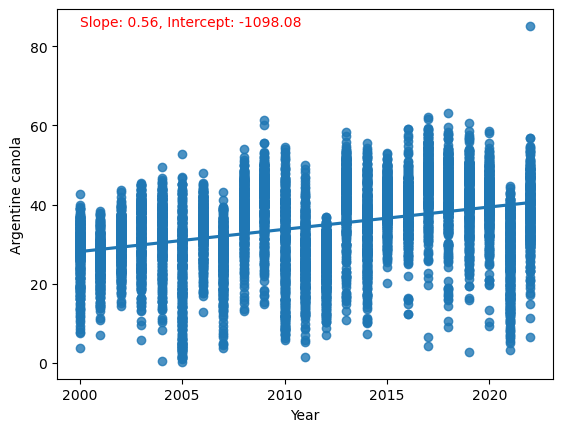

In [50]:
import seaborn as sb
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress

# Assuming 'ds' is your DataFrame, and it contains 'Year' and 'Argentine canola' columns

# First, we'll remove any rows where 'Argentine canola' or 'Year' might be NaN
cleaned_ds = ds.dropna(subset=['Argentine canola', 'Year'])

# Calculate the slope and intercept of the regression line
slope, intercept, r_value, p_value, std_err = linregress(cleaned_ds['Year'], cleaned_ds['Argentine canola'])

# Now, plot the regression line with seaborn's regplot
sb.regplot(data=cleaned_ds, x='Year', y='Argentine canola')

# Annotate the plot with the slope and intercept
# Adjust the position of the annotation based on your plot's axes limits
plt.text(x=min(cleaned_ds['Year']), y=max(cleaned_ds['Argentine canola']), 
         s=f'Slope: {slope:.2f}, Intercept: {intercept:.2f}', 
         color='red')

plt.show()


In [51]:
ds_can_und_80=ds.loc[ds['Argentine canola']<80]

<Axes: xlabel='Year', ylabel='Argentine canola'>

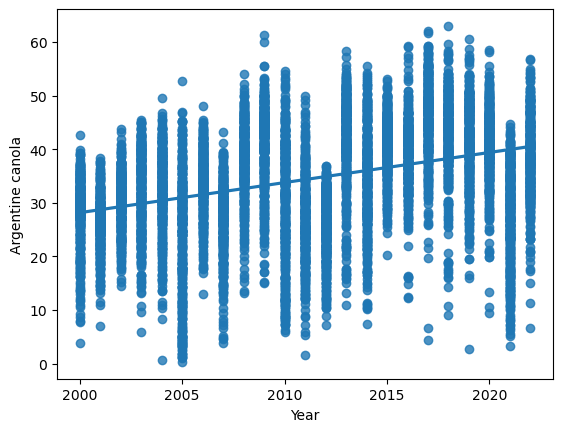

In [52]:
# Not enough data for scatter plot
sb.regplot(data = ds_can_und_80, y='Argentine canola', x='Year')

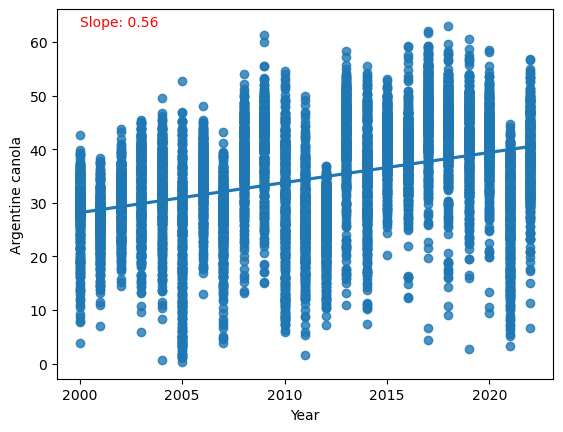

In [53]:
import seaborn as sb
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress

# Assuming 'ds' is your DataFrame, and it contains 'Year' and 'Argentine canola' columns

# First, we'll remove any rows where 'Argentine canola' or 'Year' might be NaN
cleaned_ds = ds_can_und_80.dropna(subset=['Argentine canola', 'Year'])

# Calculate the slope and intercept of the regression line
slope, intercept, r_value, p_value, std_err = linregress(cleaned_ds['Year'], cleaned_ds['Argentine canola'])

# Now, plot the regression line with seaborn's regplot
sb.regplot(data=cleaned_ds, x='Year', y='Argentine canola')

# Annotate the plot with the slope
# Adjust the position of the annotation based on your plot's axes limits
plt.text(x=min(cleaned_ds['Year']), y=max(cleaned_ds['Argentine canola']), 
         s=f'Slope: {slope:.2f}', 
         color='red')

plt.show()

canola yeild = 0.56 * Year - 1098.08, 
Year =2010, 0.56 *20

In [54]:
.56 *2010 - 1098.08

27.52000000000021

In [55]:
.56 *2020 - 1098.08

33.12000000000012

In [38]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24887 entries, 0 to 24886
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Year              24887 non-null  int64  
 1   Rm                24887 non-null  object 
 2   Soil              24887 non-null  object 
 3   Farms             24887 non-null  int64  
 4   Acres             24887 non-null  object 
 5   Unit              24887 non-null  object 
 6   Alfalfa           415 non-null    float64
 7   Argentine canola  9543 non-null   float64
 8   Barley            4891 non-null   float64
 9   Canaryseed        182 non-null    float64
 10  Durum wheat       70 non-null     float64
 11  Fababeans         25 non-null     float64
 12  Field peas        916 non-null    float64
 13  Flax              1813 non-null   float64
 14  Lentils           10 non-null     float64
 15  Oats              5059 non-null   float64
 16  Winter wheat      1963 non-null   float6

In [39]:
# Make a copy of ds and Convert 'Acres' column to float64
# Create a copy of the original DataFrame
ds_ypa = ds.copy()


In [40]:
# Removing commas
ds_ypa['Acres'] = ds_ypa['Acres'].str.replace(',', '').astype(float)

In [41]:
# Create a copy of the original DataFrame
ds_ypa = ds.copy()

# Removing commas
ds_ypa['Acres'] = ds_ypa['Acres'].str.replace(',', '').astype(float)

Crop_list = ['Alfalfa', 'Argentine canola', 'Barley', 'Canaryseed', 'Durum wheat', 'Fababeans', 'Field peas', 'Flax', 'Lentils', 'Oats', 'Winter wheat']


# Convert crop yields to yield per acre
for crop in Crop_list:
    ds_ypa[crop] = ds_ypa[crop] / ds_ypa['Acres']

# Drop the 'Acres' column as it is no longer needed
ds_ypa.drop('Acres', axis=1, inplace=True)

ds_ypa

Crop,Year,Rm,Soil,Farms,Unit,Alfalfa,Argentine canola,Barley,Canaryseed,Durum wheat,Fababeans,Field peas,Flax,Lentils,Oats,Winter wheat
0,2000,ALEXANDER,E,6,Bushels,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2000,ALEXANDER,E,10,Bushels,NaN,0.015441,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2000,ALEXANDER,F,8,Bushels,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2000,ALEXANDER,F,12,Bushels,NaN,0.010037,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2000,ALEXANDER,G,10,Bushels,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24882,2022,YELLOWHEAD,B,7,Bushels,NaN,NaN,NaN,NaN,NaN,NaN,0.027526,NaN,NaN,NaN,NaN
24883,2022,YELLOWHEAD,B,17,Bushels,NaN,NaN,0.01668,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24884,2022,YELLOWHEAD,B,49,Bushels,NaN,0.001574,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24885,2022,REYNOLDS,F,5,Bushels,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [55]:
ds_ypa_adjust = ds_ypa.copy()

In [56]:
ds_ypa_adjust[Crop_list] = ds_ypa_adjust[Crop_list] * 1000

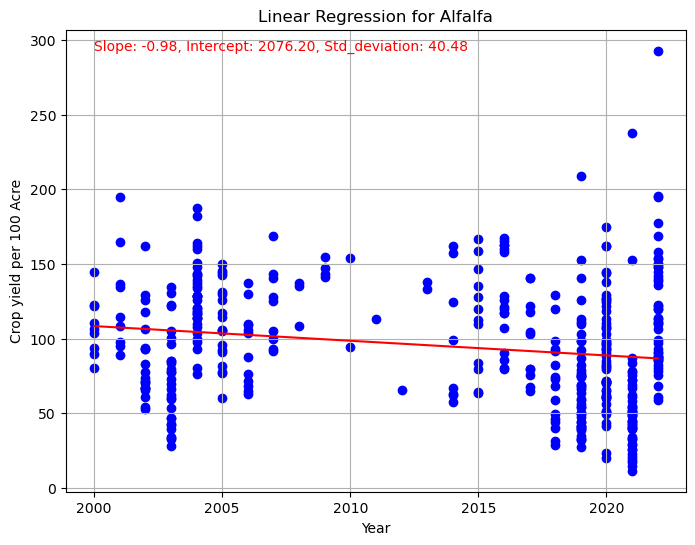

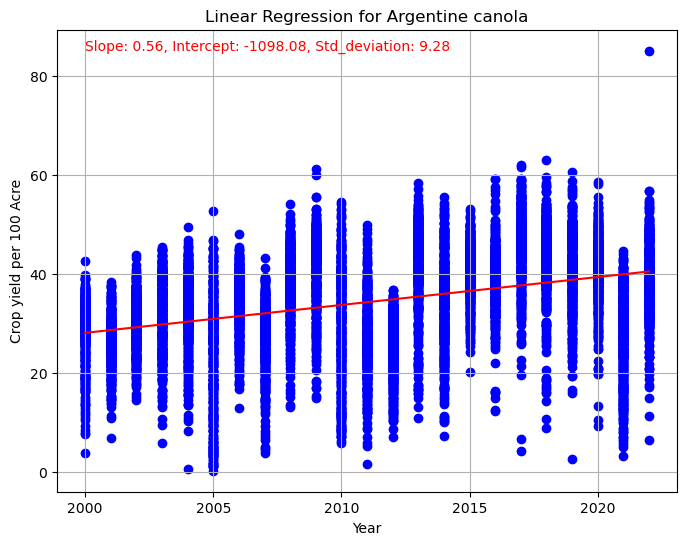

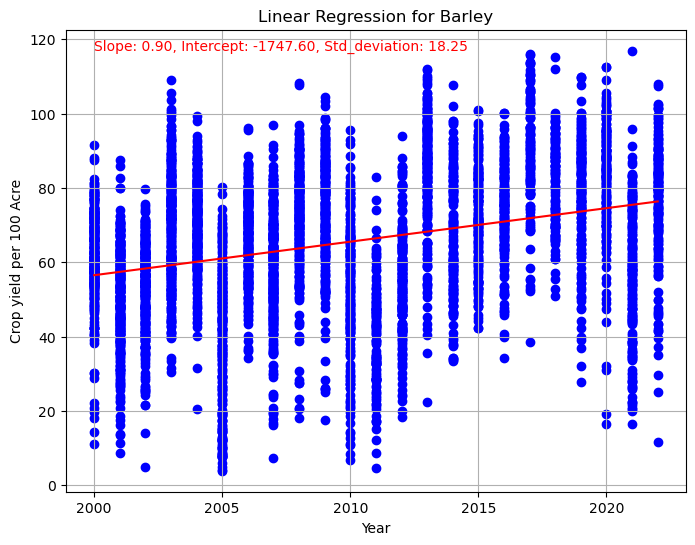

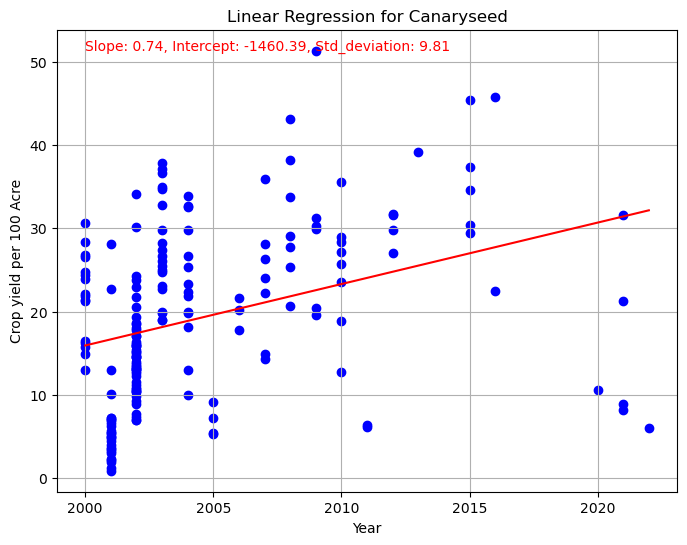

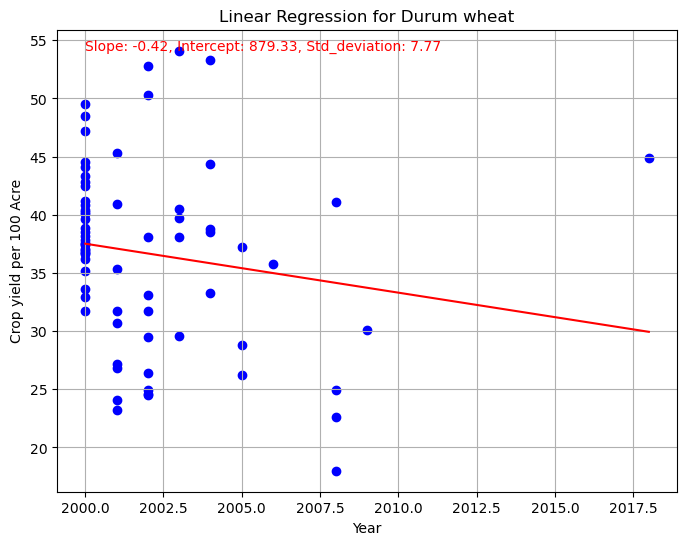

...

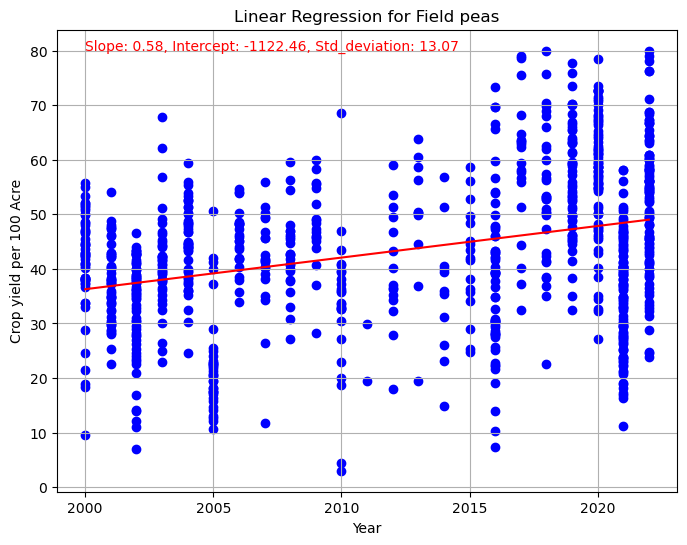

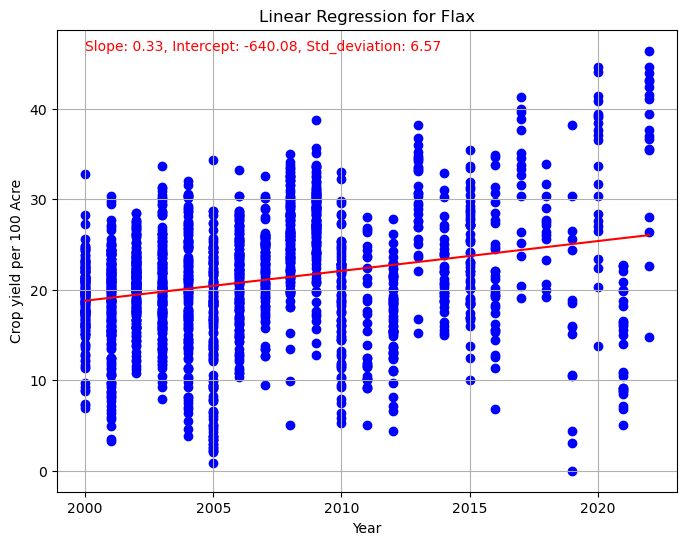

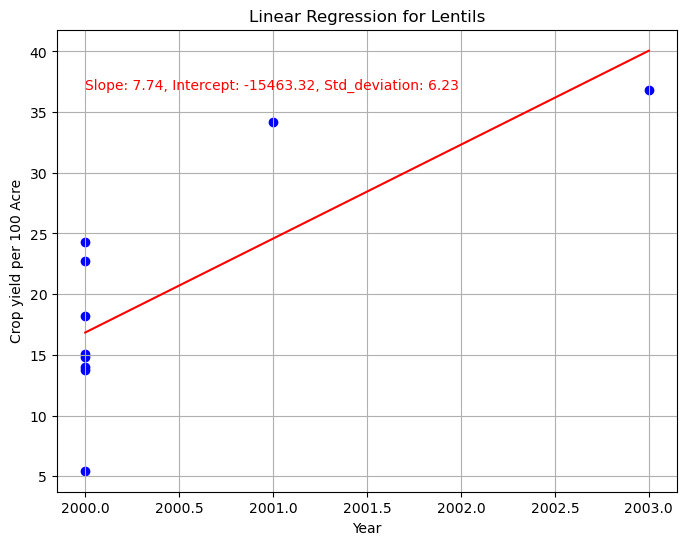

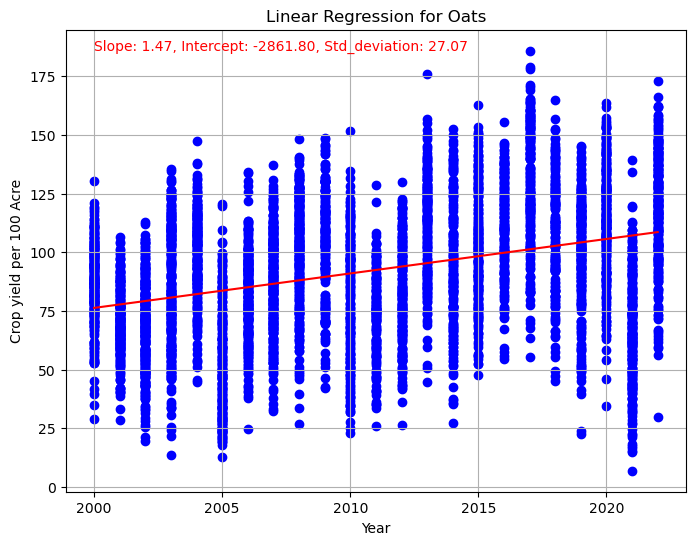

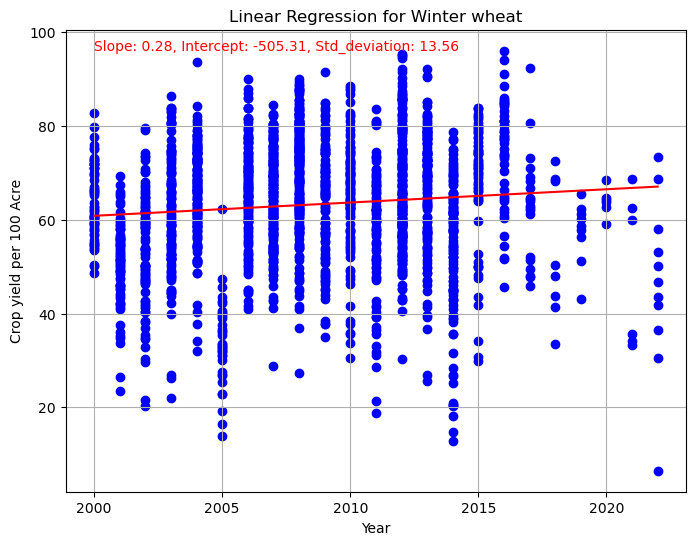

Crop: Alfalfa, Regression Equation: Y = -0.98 * Year + 2076.20, Standard Deviation: 40.48
Crop: Argentine canola, Regression Equation: Y = 0.56 * Year + -1098.08, Standard Deviation: 9.28
Crop: Barley, Regression Equation: Y = 0.90 * Year + -1747.60, Standard Deviation: 18.25
Crop: Canaryseed, Regression Equation: Y = 0.74 * Year + -1460.39, Standard Deviation: 9.81
Crop: Durum wheat, Regression Equation: Y = -0.42 * Year + 879.33, Standard Deviation: 7.77
Crop: Fababeans, Regression Equation: Y = 0.80 * Year + -1558.46, Standard Deviation: 10.38
Crop: Field peas, Regression Equation: Y = 0.58 * Year + -1122.46, Standard Deviation: 13.07
Crop: Flax, Regression Equation: Y = 0.33 * Year + -640.08, Standard Deviation: 6.57
Crop: Lentils, Regression Equation: Y = 7.74 * Year + -15463.32, Standard Deviation: 6.23
Crop: Oats, Regression Equation: Y = 1.47 * Year + -2861.80, Standard Deviation: 27.07
Crop: Winter wheat, Regression Equation: Y = 0.28 * Year + -505.31, Standard Deviation: 13.5

In [66]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress

Crop_list = ['Alfalfa', 'Argentine canola', 'Barley', 'Canaryseed', 'Durum wheat', 'Fababeans', 'Field peas', 'Flax', 'Lentils', 'Oats', 'Winter wheat']

# Function to calculate linear regression lines, slopes, intercepts, and standard deviations per crop
def calculate_regression(ds_ypa, crop_list):
    regression_results = {}

    for crop in crop_list:
        # Remove rows with NaN values
        cleaned_ds_ypa = ds_ypa.dropna(subset=[crop, 'Year'])
        slope, intercept, r_value, p_value, std_err = linregress(cleaned_ds_ypa['Year'], cleaned_ds_ypa[crop])

        # Calculate residuals
        residuals = cleaned_ds_ypa[crop] - (slope * cleaned_ds_ypa['Year'] + intercept)

        # Calculate standard deviation from residuals
        std_deviation = residuals.std()

        # Store regression results
        regression_results[crop] = {'slope': slope, 'intercept': intercept, 'std_deviation': std_deviation}

        # Plot linear regression line
        plt.figure(figsize=(8, 6))
        plt.scatter(cleaned_ds_ypa['Year'], cleaned_ds_ypa[crop], color='blue', label='Data points')
        plt.plot(cleaned_ds_ypa['Year'], slope * cleaned_ds_ypa['Year'] + intercept, color='red', label='Regression line')
        plt.title(f'Linear Regression for {crop}')
        plt.xlabel('Year')
        plt.ylabel('Crop yield per 100 Acre')
        #plt.legend()
        plt.grid(True)
        plt.text(x=min(cleaned_ds_ypa['Year']), y=max(cleaned_ds_ypa[crop]), 
         s=f'Slope: {slope:.2f}, Intercept: {intercept:.2f}, Std_deviation: {std_deviation:.2f}', 
         color='red')
        plt.show()

    return regression_results

# Calculate regression slopes, intercepts, and standard deviations
regression_results = calculate_regression(ds, Crop_list)

# Output regression equations and standard deviations per crop
for crop, data in regression_results.items():
    print(f"Crop: {crop}, Regression Equation: Y = {data['slope']:.2f} * Year + {data['intercept']:.2f}, Standard Deviation: {data['std_deviation']:.2f}")

In [65]:
def predict_yield_and_std_deviation(crop, year):
    if crop in regression_results:
        regression_data = regression_results[crop]
        slope = regression_data['slope']
        intercept = regression_data['intercept']
        std_deviation = regression_data['std_deviation']
        predicted_yield = slope * year + intercept
        return predicted_yield, std_deviation
    else:
        return "Regression data not available for the given crop."

# Example usage:
crop = 'Alfalfa'
year = 2025
predicted_yield, std_deviation = predict_yield_and_std_deviation(crop, year)
print(f"Predicted yield/100 Acres for {crop} in {year}: {predicted_yield:.2f}")
print(f"Standard deviation for {crop} in {year}: {std_deviation:.2f}")

Predicted yield/100 Acres for Alfalfa in 2025: 83.81
Standard deviation for Alfalfa in 2025: 40.48


## Bar Graphs

### Crops Yields by RM

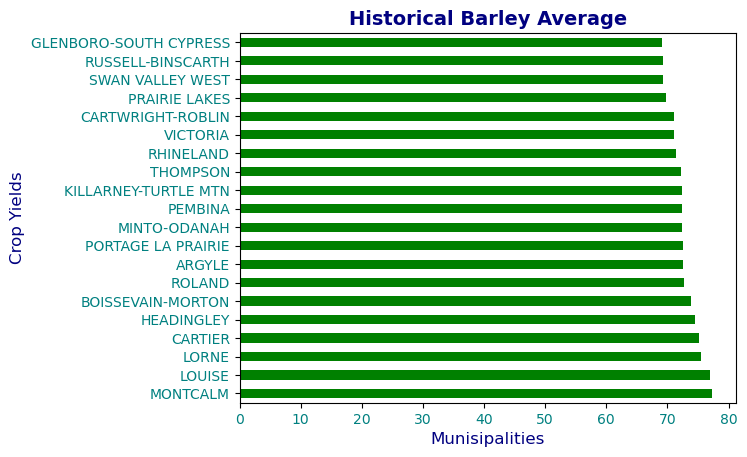

In [56]:
# Dp it by year to see if there is a difference
# groupby is function that aggragates data based on index or catigirical variable
ds.set_index('Rm')[columns_yield]['Barley']\
    .groupby('Rm').mean()\
    .sort_values(ascending=False)[:20]\
    .plot(kind='barh', color='green')
plt.title('Historical Barley Average', color= 'navy', size = 14, fontweight='bold')
plt.xlabel('Munisipalities', color= 'navy', size = 12)
plt.ylabel ('Crop Yields', color= 'navy', size = 12)
plt.xticks(color='teal')
plt.yticks(color='teal')
plt.show()


### Crop Yields by Soil Types

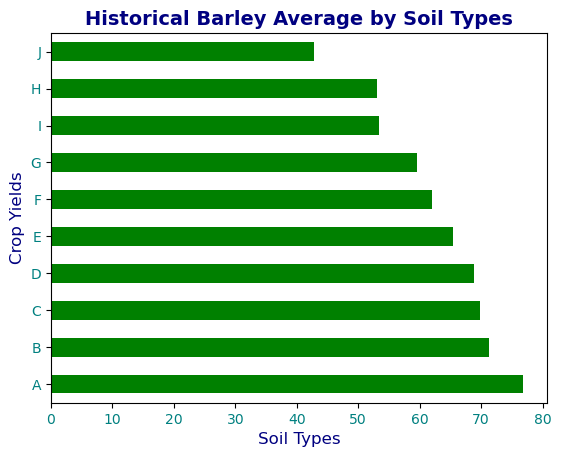

In [57]:
# Dp it by year to see if there is a difference
# groupby is function that aggragates data based on index or catigirical variable
ds.set_index('Soil')[columns_yield]['Barley']\
    .groupby('Soil').mean()\
    .sort_values(ascending=False)[:20]\
    .plot(kind='barh', color='green')
plt.title('Historical Barley Average by Soil Types', color= 'navy', size = 14, fontweight='bold')
plt.xlabel('Soil Types', color= 'navy', size = 12)
plt.ylabel ('Crop Yields', color= 'navy', size = 12)
plt.xticks(color='teal')
plt.yticks(color='teal')
plt.show()

## GIS Analysis

In [58]:
# selecting columns we need
gdf=gdf[['MUNI_LIST_', 'geometry']].rename(columns={'MUNI_LIST_':'Rm'})

In [59]:
len(ds)

24887

In [60]:
# Aggragating based on RM and Year and dropping soil types

ds_agg=ds.set_index(['Year', 'Rm'])[columns_yield].groupby(['Year', 'Rm']).mean()\
    .reset_index()

# Replacing , with empty space for some RMs

#ds_agg['Rm']=ds_agg['Rm'].str.replace('.', '')

In [61]:
# Merging Yield and GIS data

df_gdf=gpd.GeoDataFrame(pd.merge(ds_agg, gdf, on='Rm', how='inner')) # default is 'inner'

# Some RMs are missing when joinging two tables, we need to make 100% match if RMs exits in both dataframes

# For Final Project
# Tip set(df1) - set(df2)

In [62]:
df_gdf.head(2)

,Year,Rm,Alfalfa,Argentine canola,Barley,Canaryseed,Durum wheat,Fababeans,Field peas,Flax,Lentils,Oats,Winter wheat,geometry
0,2000,ALEXANDER,NaN,19.975,18.1,NaN,NaN,NaN,NaN,NaN,NaN,72.966667,NaN,"POLYGON ((-10741721.346 6564808.271, -10741693..."
1,2001,ALEXANDER,NaN,19.275,18.7,NaN,NaN,NaN,NaN,NaN,NaN,62.875000,NaN,"POLYGON ((-10741721.346 6564808.271, -10741693..."


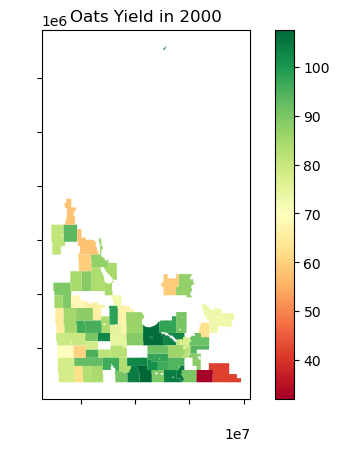

In [63]:
# One Year Plot
df_gdf[df_gdf['Year']==2000].plot(column='Oats', cmap='RdYlGn', legend=True)
plt.title('Oats Yield in 2000')
plt.yticks(color='white')
plt.xticks(color='white')
plt.show()

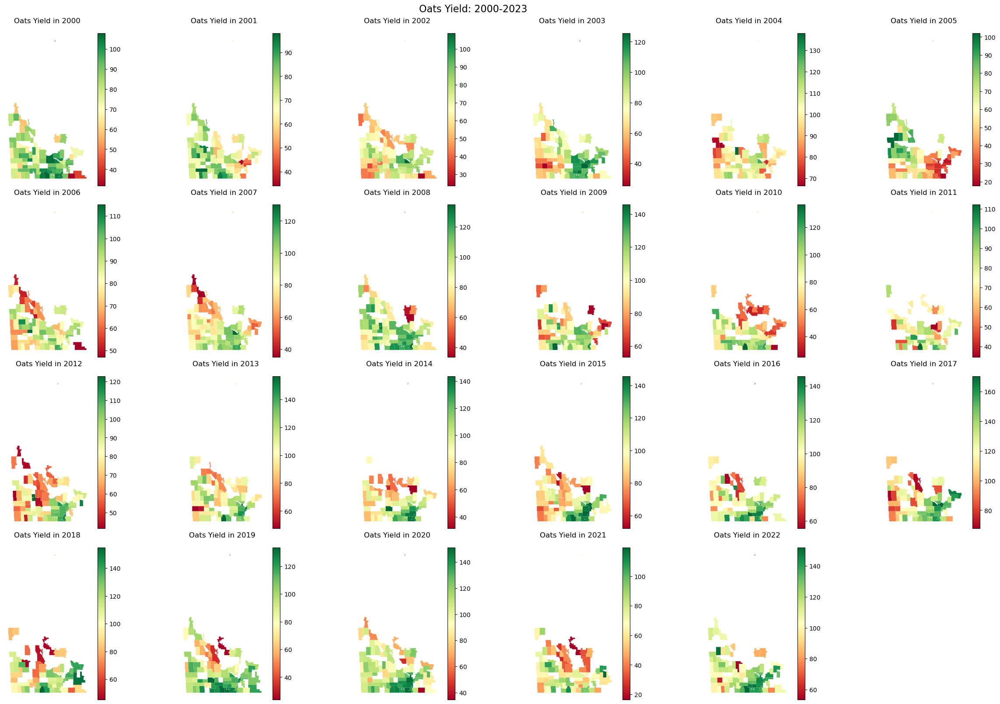

In [64]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming df_gdf is your GeoDataFrame and it includes a 'Year' column, geometries, and an 'Oats' column

# Prepare the figure layout for plotting
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(24, 16), constrained_layout=True)
fig.suptitle('Oats Yield: 2000-2023', fontsize=16)

# Flatten the axes array for easier access
axes_flat = axes.flatten()

for i, year in enumerate(range(2000, 2024)):
    ax = axes_flat[i]
    # Filter the GeoDataFrame for the current year
    df_year = df_gdf[df_gdf['Year'] == year]
    
    # Check if there is data for the year to plot
    if not df_year.empty:
        df_year.plot(column='Oats', ax=ax, legend=True, cmap='RdYlGn')
        ax.set_title(f'Oats Yield in {year}')
        ax.axis('off')  # Optionally turn off the axis if preferred for visual clarity
    else:
        # In case there's no data for a year, you can choose to leave the plot empty
        ax.axis('off')

plt.show()

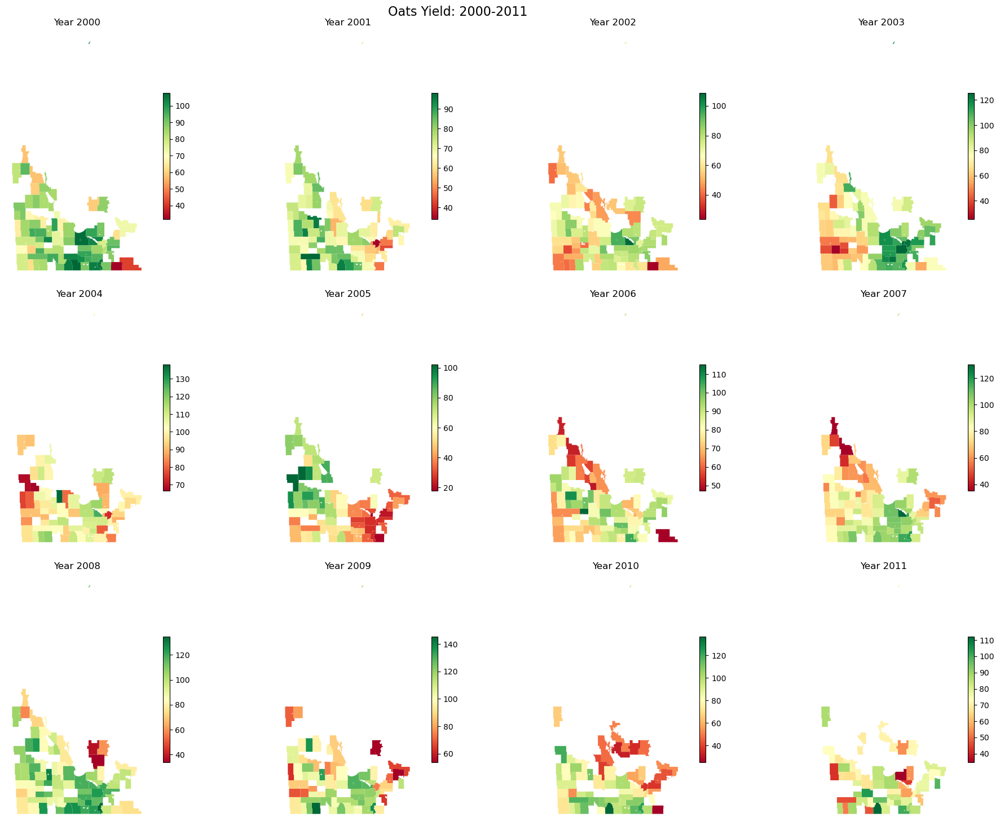

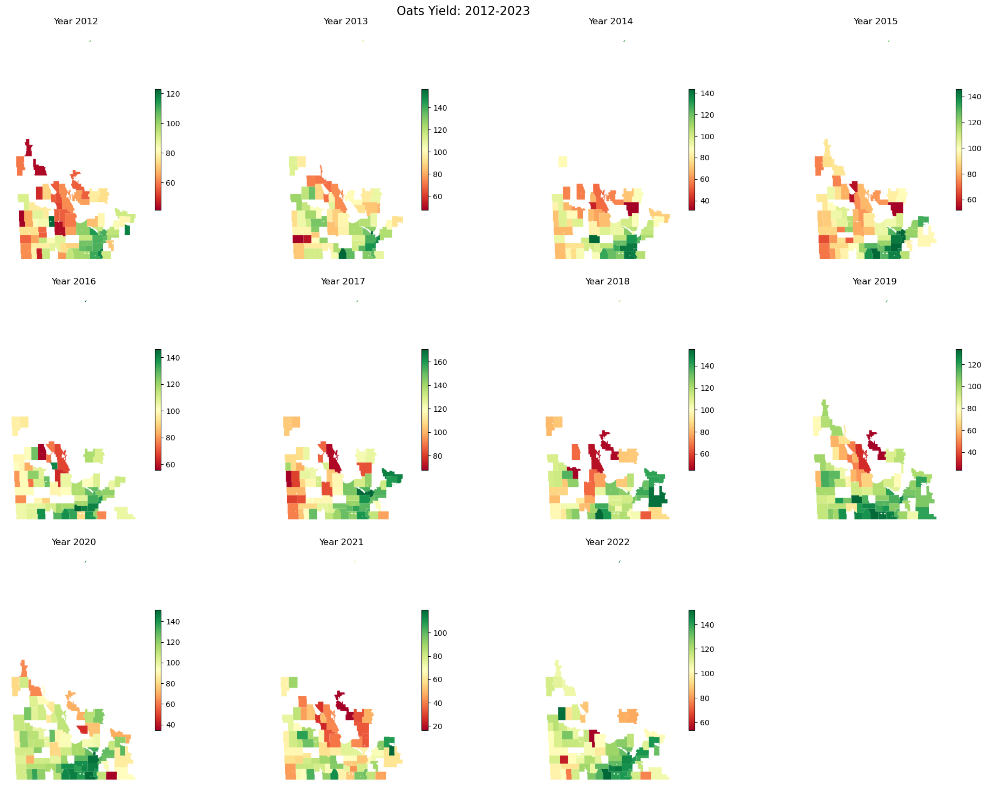

In [65]:
# Two plots with dozen years
import geopandas as gpd
import matplotlib.pyplot as plt

# Your GeoDataFrame is assumed to be named df_gdf with 'Year' and 'Oats' columns

# Function to plot a set of years
def plot_oats_yield(df, years, title, nrows, ncols):
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 15))
    fig.suptitle(title, fontsize=16)
    axes_flat = axes.flatten()
    
    for i, year in enumerate(years):
        ax = axes_flat[i]
        df_year = df[df['Year'] == year]
        if not df_year.empty:
            df_year.plot(column='Oats', ax=ax, legend=True, cmap='RdYlGn', legend_kwds={'shrink': 0.5})
            ax.set_title(f'Year {year}')
        ax.axis('off')
    
    # Hide any unused subplots
    for j in range(i + 1, nrows * ncols):
        axes_flat[j].axis('off')
    
    plt.tight_layout()

# Plot the first set of years (2000-2011)
years_first_part = range(2000, 2012)
plot_oats_yield(df_gdf, years_first_part, 'Oats Yield: 2000-2011', nrows=3, ncols=4)

# Plot the second set of years (2012-2023)
years_second_part = range(2012, 2024)
plot_oats_yield(df_gdf, years_second_part, 'Oats Yield: 2012-2023', nrows=3, ncols=4)

In [66]:
# One Year Plot
df_gdf[df_gdf['Year']==2000].explore(
    column='Oats', 
    cmap='RdYlGn', 
    legend=True,
    tiles='CartoDB positron',
    tooltip=['Rm', 'Oats'])

# Feature Selection

In [67]:
# Creating Data Aggregation
# mean and std

df_agg=df_gdf.set_index(['Year', 'Rm'])[columns_yield].groupby('Rm').agg(['mean', 'std'])

df_agg.columns = ['{}_{}'.format(col[0], col[1]) for col in df_agg.columns]

In [68]:
# We have created new features to train our model
df_agg

,Alfalfa_mean,Alfalfa_std,Argentine canola_mean,Argentine canola_std,Barley_mean,Barley_std,Canaryseed_mean,Canaryseed_std,Durum wheat_mean,Durum wheat_std,...,Field peas_mean,Field peas_std,Flax_mean,Flax_std,Lentils_mean,Lentils_std,Oats_mean,Oats_std,Winter wheat_mean,Winter wheat_std
Rm,,,,,,,,,,,,,,,,,,,,,
ALEXANDER,NaN,NaN,30.567754,12.050493,43.045833,21.799953,17.560000,1.979899,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,84.340877,30.045699,77.233333,2.259056
ALONSA,76.270000,27.396228,28.286288,7.925825,55.422222,17.774133,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,65.107870,18.547448,63.700000,6.505382
ARGYLE,106.254000,55.244015,35.572402,6.153786,72.410580,12.773757,NaN,NaN,NaN,NaN,...,42.700000,23.051681,20.367424,3.072215,NaN,NaN,94.934638,23.337292,65.947593,6.395484
ARMSTRONG,72.840000,51.276356,26.288462,11.504784,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,58.516667,24.167088,NaN,NaN
BIFROST-RIVERTON,111.067031,43.664513,30.317474,9.829486,55.329318,25.448353,15.567333,5.031236,NaN,NaN,...,35.508333,16.790139,17.886905,8.070904,NaN,NaN,85.704275,21.997279,61.634074,10.818843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WHITEHEAD,NaN,NaN,32.159374,7.336920,55.092857,10.894969,NaN,NaN,37.833333,NaN,...,42.900000,NaN,19.535000,4.684210,NaN,NaN,72.996429,18.917734,50.590476,4.019401
WHITEMOUTH,NaN,NaN,31.666288,13.648167,36.741667,22.860762,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,102.112500,23.833314,66.024074,7.773473
WINNIPEG,NaN,NaN,30.249242,10.968979,53.400000,NaN,8.900000,NaN,NaN,NaN,...,NaN,NaN,9.000000,0.989949,NaN,NaN,94.329762,39.344662,NaN,NaN


In [69]:
df_bar = df_agg[['Barley_mean', 'Barley_std']]

c:\Users\valued customer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\valued customer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\valued customer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\valued customer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans 

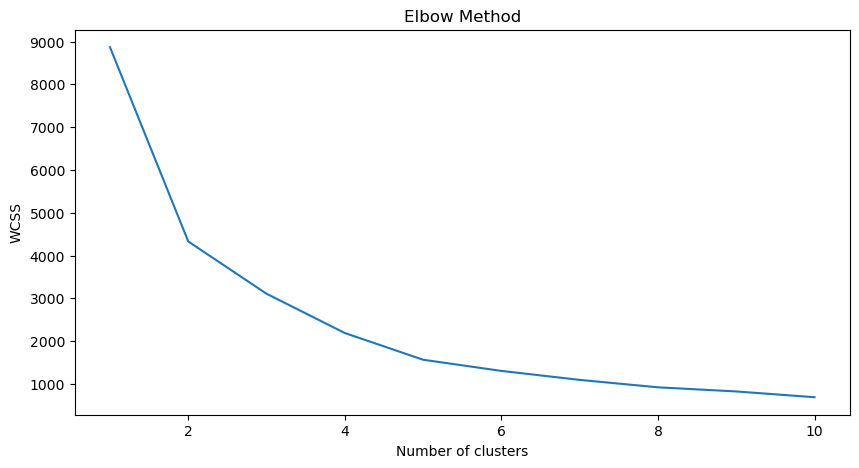

In [75]:
from sklearn.cluster import KMeans

# Assuming df_bar is your DataFrame and it has 'Barley_mean' and 'Barley_std' columns
X = df_bar[['Barley_mean', 'Barley_std']].dropna()

# Step 1: Elbow method to find the optimal number of clusters
wcss = []  # Within-cluster sum of squares
for i in range(1, 11):  # Trying different numbers of clusters, from 1 to 10
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

# Plotting the results onto a line graph to observe the 'elbow'
plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')  # Within-cluster sum of squares
plt.show()




In [76]:
# Step 2: Apply K-means clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=5, init='k-means++', max_iter=300, n_init=10, random_state=0)
X['Labels'] = kmeans.fit_predict(X)


c:\Users\valued customer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


In [77]:
X

,Barley_mean,Barley_std,Labels
Rm,,,
ALEXANDER,43.045833,21.799953,3
ALONSA,55.422222,17.774133,1
ARGYLE,72.410580,12.773757,0
BIFROST-RIVERTON,55.329318,25.448353,1
BOISSEVAIN-MORTON,73.871739,13.872093,0
...,...,...,...
WESTLAKE-GLADSTONE,66.360217,17.181689,4
WHITEHEAD,55.092857,10.894969,1
WHITEMOUTH,36.741667,22.860762,3


<Axes: >

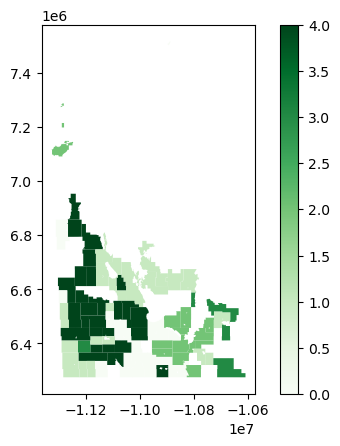

In [78]:
pd.merge(gdf, X, on='Rm').plot('Labels', cmap='Greens', legend=True, k=4)

Clusters randomly assigned we need to label them.

In [74]:
# Rank clusters - 10 Percent

X.groupby('Labels').mean().sort_values('Barley_mean')

,Barley_mean,Barley_std
Labels,,
3,39.830919,20.878695
1,55.313090,15.843011
4,65.314620,14.880730
2,67.130926,24.735376
0,73.975198,17.002050


# Elbow Method

# Data Standardizing

Z socre - > values shows how many std far from the mean (depending on data -3 and 3)
Min/Scaler - in between 0 and 1

We are not going to do data stand as mean and std of crop yields are same unit.

# Machine Learning

## Unsupervised ML

UML - We do not label data - Clustering Analysis - Based weather, data aggragation (historical average vs historical std)

One variable clustering

Two variabeles to cluster

Models - K Means - it shows similarties, DBSCAN - Shows dissimilarities

No Error Analysis and no training and test data


## Supervised ML - Will try outside of final project content

## Split Data

shuffle data and split it to two parts train (80 percent) and test (20 percent)

Deep learning we have train, validation and test

## Do EDA again on Training SET

SML - Regression (Tareget variable is continous) / Classifcation (target variable is catigorical) We do label data - Target Variable/ Features - We use features to predicts target variable/ dependent and independent variables

We do not have features - it would be climate, soil moisture and type, fertilezer use, pestiside use/ farm practises/ farm experience years/

Correlation but not causation


## Standardize it

# Error Aanalysis SML

We use diffenent tech to find errors in model

prediction - acual = error

1. Mean Absolute Error (MAE)
2. Mean Least Squared Error (MLSE)

Trained ten models and choose one with less error or the one solves your prblem the best.